# 1. Imports

This code imports essential libraries and modules for data manipulation, visualization, preprocessing, machine learning, and deep learning. It covers tools for building and evaluating models, statistical analysis, and managing imbalanced datasets, ensuring a streamlined workflow for diverse data science tasks.

In [2948]:
# Basic Libraries
import numpy as np  # Numerical operations
import pandas as pd  # Data manipulation and analysis

# Data Visualization
import matplotlib.pyplot as plt  # Plotting
import seaborn as sns  # Advanced visualizations

# Preprocessing
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV  # Splitting data and hyperparameter tuning
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder, OneHotEncoder  # Data scaling and encoding
from sklearn.impute import SimpleImputer  # Handling missing data
from sklearn.compose import ColumnTransformer  # For column-based transformations
from sklearn.pipeline import Pipeline  # To streamline processing workflows

# Machine Learning Models
from sklearn.linear_model import LogisticRegression  # Logistic Regression
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier  # Random Forest, Bagging Classifier
from sklearn.svm import SVC  # Support Vector Machine
from sklearn.neighbors import KNeighborsClassifier  # K-Nearest Neighbors
from sklearn.tree import DecisionTreeClassifier  # Decision Tree
from sklearn.naive_bayes import GaussianNB  # Naive Bayes
from xgboost import XGBClassifier  # XGBoost
import xgboost as xgb
# Model Evaluation
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report  # Evaluation metrics
from sklearn.metrics import roc_curve, auc, precision_score, recall_score, f1_score  # Other performance metrics

# Handling Imbalanced Datasets
from imblearn.over_sampling import SMOTE  # Synthetic data generation for balancing classes

# Statistical Analysis
import scipy.stats as stats  # Statistical functions
from statsmodels.stats.outliers_influence import variance_inflation_factor  # VIF for multicollinearity
from statsmodels.tools.tools import add_constant  # Add constant to model

# Working with Files and Directories
import os  # File and directory management

# Handling Warnings
import warnings  # Suppress warnings
warnings.filterwarnings('ignore')  # Ignore warnings globally

# Deep Learning
from tensorflow.keras.models import Sequential  # Building models
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D  # Model layers
from tensorflow.keras.optimizers import Adam  # Optimizers
from tensorflow.keras.utils import to_categorical  # One-hot encoding

# IPython Display (for Jupyter Notebooks)
from IPython.display import display, HTML  # Display HTML content

# 2. Load Datasets

This code loads datasets for cotton and rice crops from CSV files across multiple years (2021–2023) using raw string paths to ensure correct file access. The datasets are read into pandas DataFrames for further analysis.

In [2949]:
# Load datasets using raw strings
cotton2021 = pd.read_csv(r'Crop-dataset\Cotton\cotton2021.csv')
cotton2022 = pd.read_csv(r'Crop-dataset\Cotton\cotton2022.csv')
cotton2023 = pd.read_csv(r'Crop-dataset\Cotton\cotton2023.csv')

rice2021 = pd.read_csv(r'Crop-dataset\Rice\rice2021.csv')
rice2022 = pd.read_csv(r'Crop-dataset\Rice\rice2022.csv')
rice2023 = pd.read_csv(r'Crop-dataset\Rice\rice2023.csv')

## 2.1. Cotton Datasets

### 2.1.1. Cotton 2021 Dataset

In [2950]:
cotton2021

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.153184,0.222615,0.498528,0.611280,0.285032,0.112775,0.529626,0.546617,0.604374,0.571359,0.620985,0.496628
1,0.137897,0.106036,0.169626,0.330396,0.594655,0.227967,0.578199,0.661604,0.783454,0.777313,0.729177,0.636792
2,0.122481,0.088123,0.182121,0.376037,0.431042,0.350422,0.630027,0.724557,0.844643,0.673307,0.736385,0.635118
3,0.085279,0.091887,0.140729,0.243528,0.224835,0.046875,0.579180,0.666857,0.611009,0.625423,0.612167,0.208681
4,0.091678,0.094313,0.247900,0.367800,0.546883,0.476697,0.699308,0.768818,0.753445,0.711491,0.707040,0.647931
...,...,...,...,...,...,...,...,...,...,...,...,...
2878,0.138030,0.329907,0.404328,0.537815,0.394826,0.113851,0.359073,0.649917,0.704158,0.726696,0.859813,0.355916
2879,0.523488,0.332649,0.226471,0.513300,0.600642,0.144718,0.612667,0.662235,0.560400,0.612191,0.804607,0.288965
2880,0.726984,0.400091,0.197898,0.247069,0.225268,0.082729,0.429161,0.774492,0.816801,0.853505,0.847405,0.730276
2881,0.265939,0.358320,0.435546,0.604886,0.475097,0.090206,0.519311,0.576597,0.691638,0.750179,0.758183,0.588785


### 2.1.2. Cotton 2022 Dataset

In [2951]:
cotton2022

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.088053,0.122912,0.203632,0.413183,0.824614,-0.012009,0.707493,0.553634,0.678005,0.601276,0.558074,0.264170
1,0.153362,0.306787,0.199341,0.344232,0.565855,-0.013706,0.512479,0.383124,0.508259,0.485459,0.426386,0.201609
2,0.106067,0.140156,0.328443,0.432596,0.567783,0.049462,0.738598,0.613374,0.881896,0.774641,0.718519,0.608508
3,0.091542,0.120096,0.244057,0.370085,0.502907,0.016404,0.617543,0.638213,0.856499,0.782228,0.730698,0.588019
4,0.080412,0.116872,0.291829,0.427347,0.688564,0.012112,0.517153,0.594714,0.845494,0.772517,0.730694,0.628959
...,...,...,...,...,...,...,...,...,...,...,...,...
12406,0.131888,0.113150,0.121260,0.114818,0.081116,0.001597,0.153307,0.304461,0.571842,0.608527,0.444227,0.364133
12407,0.185016,0.155825,0.146379,0.107036,0.067559,-0.020984,0.119457,0.178660,0.458241,0.513371,0.457156,0.394199
12408,0.122058,0.108996,0.126322,0.141570,0.128411,0.003110,0.165837,0.070270,0.196294,0.088979,0.081822,0.084518
12409,0.172523,0.168709,0.168362,0.139394,0.108651,-0.045763,0.254163,0.055743,0.131894,0.077957,0.081376,0.077510


### 2.1.3. Cotton 2023 Dataset

In [2952]:
cotton2023

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.112304,0.168831,0.357419,0.652470,0.511220,0.071754,0.746601,0.714075,0.747262,0.729675,0.634746,0.199640
1,0.111033,0.149460,0.360941,0.404814,0.385993,0.089474,0.647436,0.637131,0.677606,0.663667,0.581217,0.438363
2,0.102703,0.226310,0.554877,0.790602,0.812145,0.090364,0.866772,0.787777,0.838983,0.784251,0.711433,0.869757
3,0.090742,0.079962,0.355833,0.864751,0.837066,0.149301,0.890619,0.795135,0.834237,0.774393,0.683996,0.840936
4,0.100312,0.077954,0.328019,0.697031,0.722988,0.242764,0.869281,0.811822,0.836173,0.802686,0.700463,0.848245
...,...,...,...,...,...,...,...,...,...,...,...,...
11772,0.130143,0.108247,0.109874,0.177338,0.178003,0.092314,0.436729,0.753542,0.868271,0.834823,0.768142,0.470518
11773,0.565473,0.733032,0.280702,0.463700,0.737765,0.328413,0.229008,0.707480,0.875504,0.923436,0.852439,0.830161
11774,0.167851,0.204945,0.371220,0.378095,0.233630,0.287593,0.615308,0.655678,0.807842,0.835634,0.825262,0.797595
11775,0.152844,0.371162,0.582090,0.826781,0.881840,0.509232,0.730275,0.321719,0.767047,0.877766,0.866667,0.817833


## 2.2. Rice Datasets

### 2.2.1. Rice 2021 Dataset

In [2953]:
rice2021

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.098886,0.103672,0.238722,0.478474,0.429209,0.281007,0.605667,0.291368,0.133020,0.779261,0.818019,0.721222
1,0.118790,0.147110,0.218349,0.652877,0.513883,0.039530,0.702403,0.646029,0.162462,0.204209,0.363850,0.155452
2,0.181040,0.146681,0.227818,0.528602,0.413309,0.041322,0.671362,0.679732,0.602896,0.199579,0.373932,0.143989
3,0.220000,0.143860,0.197724,0.676182,0.534545,0.054701,0.706315,0.636900,0.216295,0.216854,0.239008,0.171939
4,0.113367,0.139415,0.411447,0.637250,0.466728,0.045908,0.691222,0.654271,0.589966,0.208658,0.211051,0.161702
...,...,...,...,...,...,...,...,...,...,...,...,...
414,0.174410,0.089574,0.409769,0.602472,0.360485,0.478802,0.669603,0.279522,0.186710,0.625578,0.933573,0.793798
415,0.124839,0.095548,0.392523,0.628841,0.453770,0.067350,0.591837,0.426808,0.712821,0.888472,0.899105,0.766911
416,0.161652,0.274931,0.581613,0.670435,0.428686,0.080011,0.217853,0.231816,0.460350,0.821652,0.829357,0.696429
417,0.141479,0.125532,0.159142,0.327632,0.307484,0.443808,0.674027,0.787402,0.780147,0.560878,0.274074,0.195003


### 2.2.2. Rice 2022 Dataset

In [2954]:
rice2022

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.442943,0.325107,0.448911,0.698456,1.000000,0.071374,0.714939,0.588107,0.571895,0.787698,0.816302,0.613884
1,0.128122,0.352554,0.533025,0.647528,1.000000,0.052378,0.534581,0.511706,0.562397,0.275249,0.553359,0.565554
2,0.400911,0.406091,0.443299,0.535024,0.978224,0.073414,0.387755,0.484515,0.605432,0.570827,0.636029,0.553675
3,0.390117,0.728009,0.760038,0.786063,1.000000,0.059971,0.555362,0.699239,0.893971,0.942492,0.869822,0.759206
4,0.117680,0.111500,0.102671,0.126739,0.144219,0.077910,0.204507,0.600983,0.762850,0.838978,0.824411,0.738954
...,...,...,...,...,...,...,...,...,...,...,...,...
4682,0.144404,0.130435,0.267739,0.273391,0.705258,0.608263,0.519339,0.483456,0.301149,0.184329,0.489453,0.671942
4683,0.144395,0.166874,0.304348,0.404255,0.654962,0.554571,0.747805,0.598974,0.739962,0.651039,0.542270,0.507232
4684,0.133390,0.277693,0.491424,0.733867,0.944731,0.686950,0.797565,0.593707,0.526810,0.454545,0.238906,0.218204
4685,0.103372,0.172175,0.415501,0.638936,0.612252,0.496590,0.510204,0.472645,0.386538,0.312476,0.273450,0.320506


### 2.2.3. Rice 2023 Dataset

In [2955]:
rice2023

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.219298,0.406830,0.620985,0.841141,0.982545,0.168539,0.784436,0.203078,0.182609,0.256804,0.381433,0.485466
1,0.290999,0.260493,0.473620,0.485981,0.650122,0.133713,1.000000,0.694864,0.665847,0.657620,0.687118,0.722555
2,0.119565,0.142857,0.124230,0.318060,0.185724,0.169022,0.510106,0.238587,0.101852,0.187604,0.160437,0.304826
3,0.242507,0.235010,0.282532,0.393004,0.318597,0.168026,0.767211,0.325995,0.232826,0.341040,0.331269,0.440540
4,0.312309,0.350049,0.657402,0.818031,0.982894,0.213175,0.591485,0.517812,0.670632,0.794137,0.791589,0.792854
...,...,...,...,...,...,...,...,...,...,...,...,...
914,0.331873,0.637595,0.860933,0.936457,0.771076,0.402954,0.884208,0.515337,0.851545,0.908714,0.895963,0.858908
915,0.333794,0.621409,0.841538,0.909154,0.736736,0.384046,0.886665,0.485586,0.846778,0.907973,0.904183,0.876847
916,0.373900,0.618582,0.856424,0.903326,0.781238,0.375578,0.889700,0.532434,0.844510,0.911383,0.905652,0.899614
917,0.349008,0.556529,0.855942,0.925486,0.800000,0.347044,0.895157,0.473819,0.812193,0.904762,0.899269,0.903632


# 3. Display Datasets Before Preprocessing

## 3.1. Plotting NDVI

This code generates individual line plots for the average NDVI values across columns in multiple datasets. Each plot is labeled with the dataset name and includes a grid, legend, and clear axis titles for effective visualization.

<Figure size 2000x800 with 0 Axes>

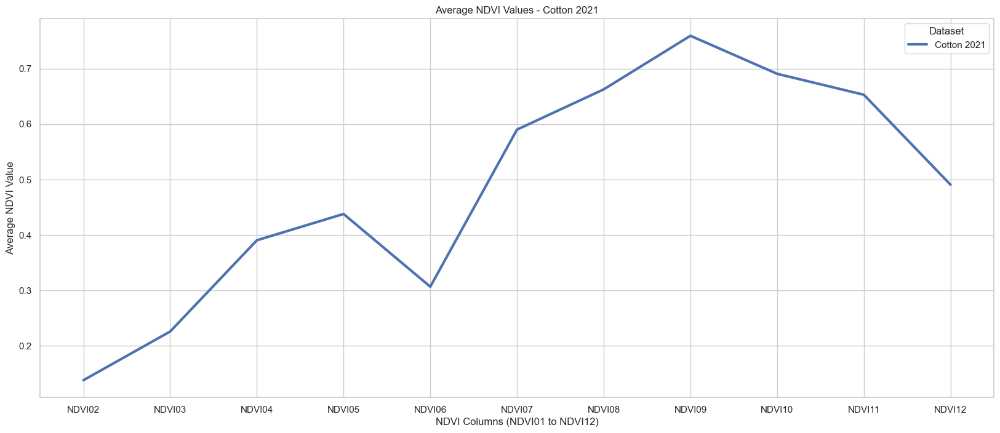

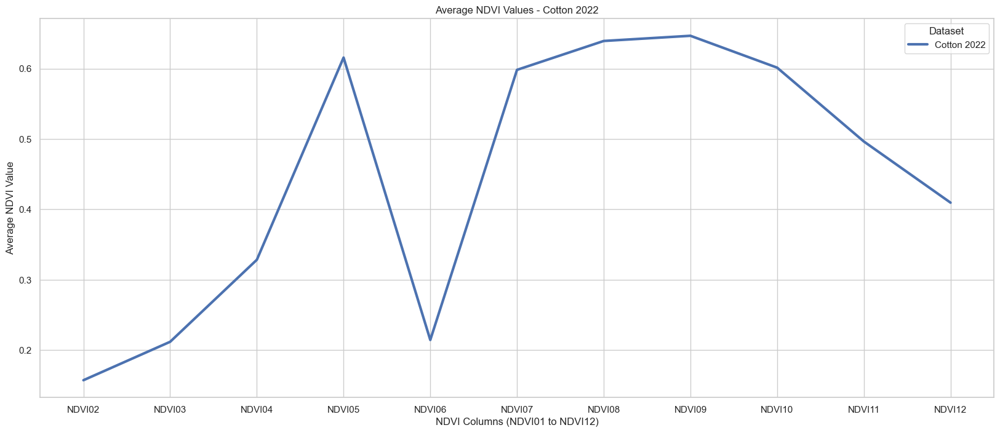

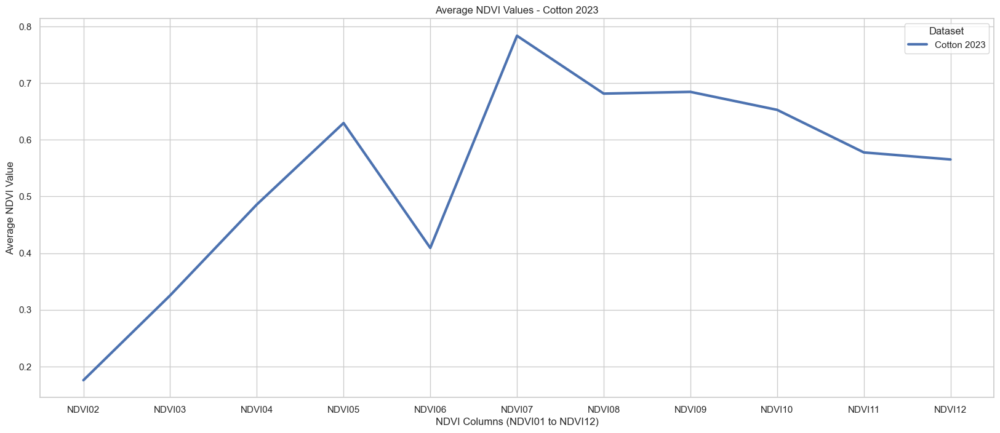

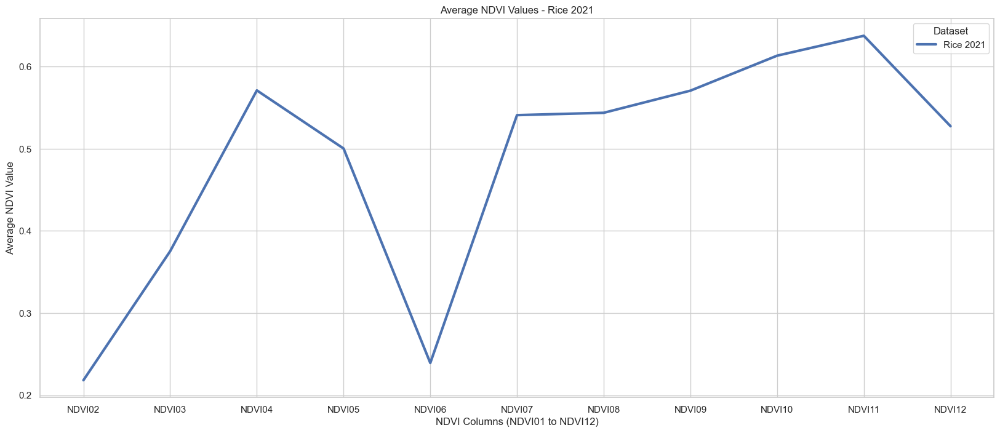

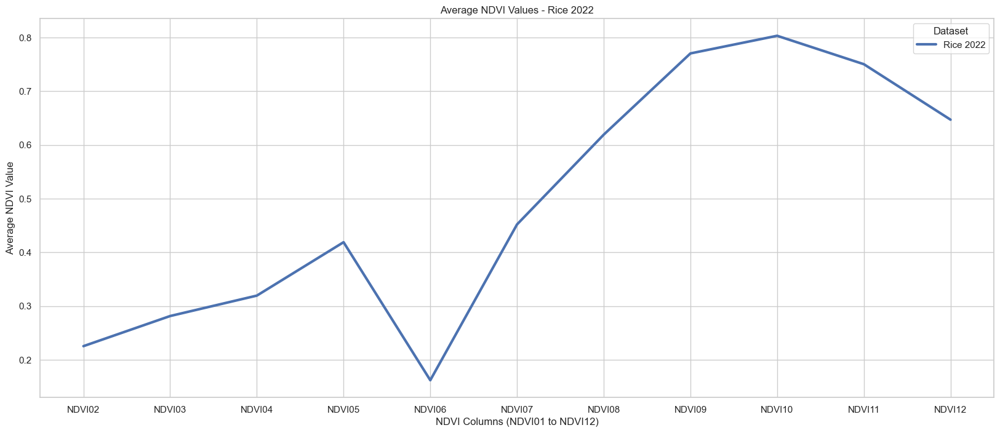

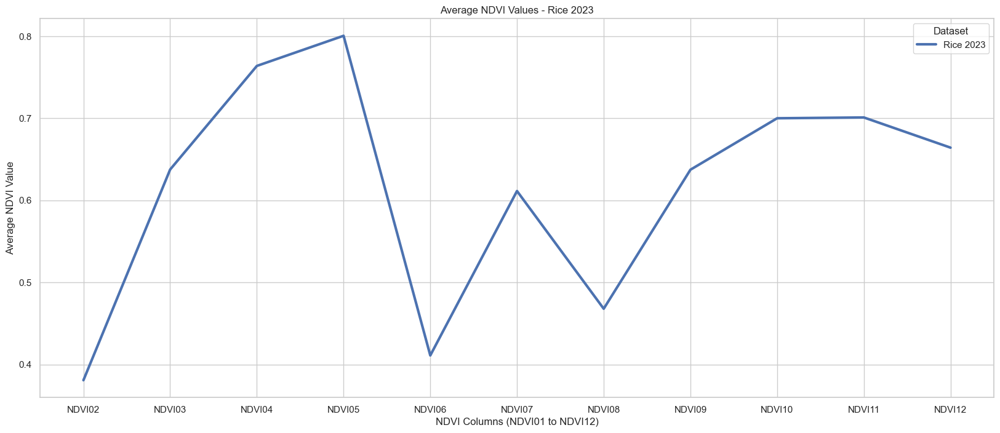

In [2956]:
# List of dataset names 
datasets = [cotton2021, cotton2022, cotton2023, rice2021, rice2022, rice2023]

# List of dataset names for titles or labeling
dataset_names = ['Cotton 2021', 'Cotton 2022', 'Cotton 2023', 'Rice 2021', 'Rice 2022', 'Rice 2023']

# Set up the plot figure
plt.figure(figsize=(20, 8))

# Iterate over each dataset
for idx, dataset in enumerate(datasets):
    # Extract dataset name for the title
    dataset_name = dataset_names[idx]
    # Assuming NDVI columns start from the second column onwards
    avg_ndvi = dataset.iloc[:, 1:].mean()  # Exclude the first column if it's not part of NDVI columns
    
    # Set up the figure for each dataset
    plt.figure(figsize=(20, 8))
    
    # Plot the average NDVI values across columns for the dataset
    plt.plot(avg_ndvi.index, avg_ndvi.values, label=dataset_name, linewidth=3)  # Increased linewidth
    
    # Add labels and title to the plot
    plt.title(f'Average NDVI Values - {dataset_name}')
    plt.xlabel('NDVI Columns (NDVI01 to NDVI12)')
    plt.ylabel('Average NDVI Value')
    plt.legend(title='Dataset', loc='best')
    plt.grid(True)
    
    # Show the plot for this dataset
    plt.show()


## 3.2. Plotting Distributions

This code suppresses specific FutureWarnings from seaborn and generates distribution plots for numeric features in multiple datasets using KDE (Kernel Density Estimation). Each plot displays the distributions of features with custom colors, labels, and a legend, providing clear visual insights into the data.

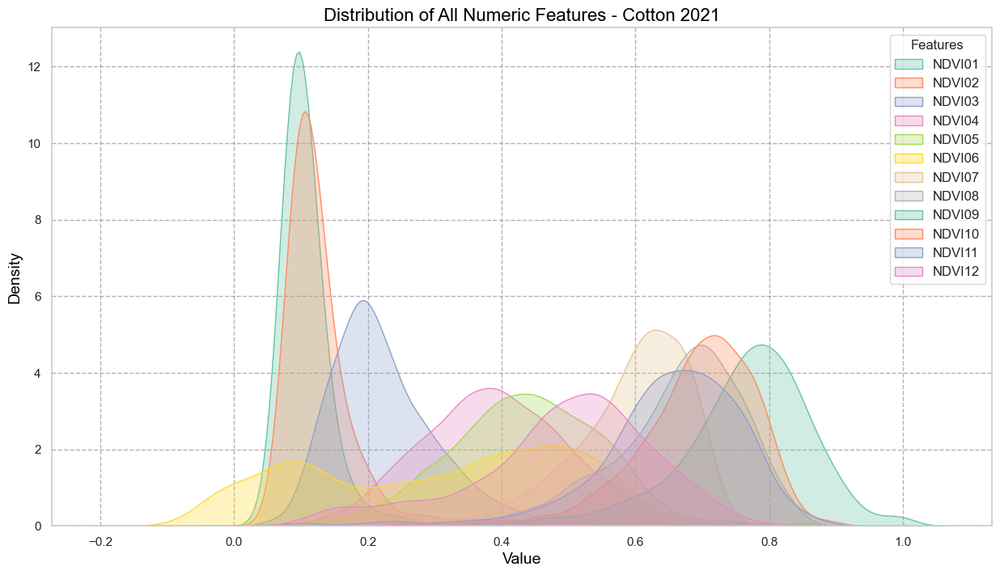

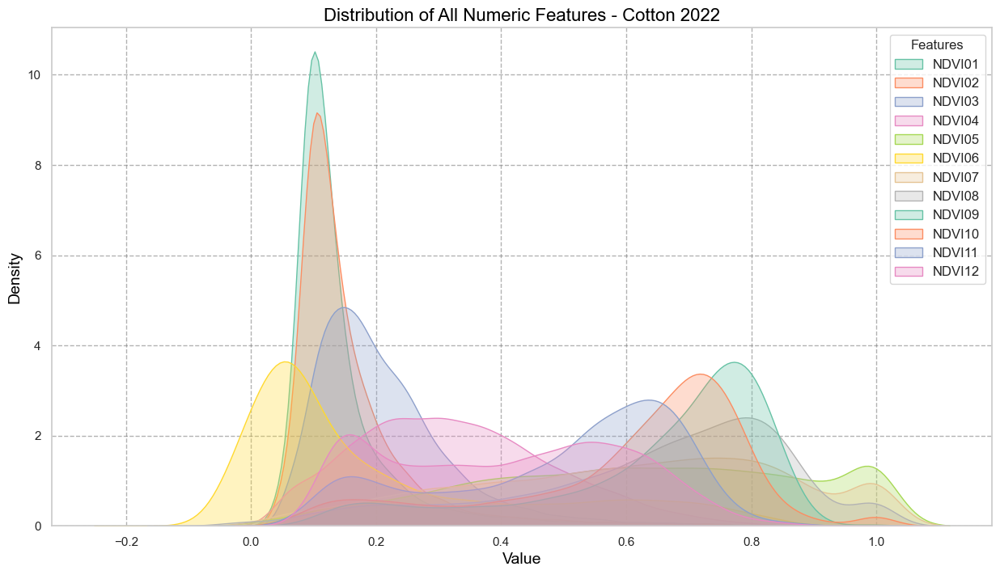

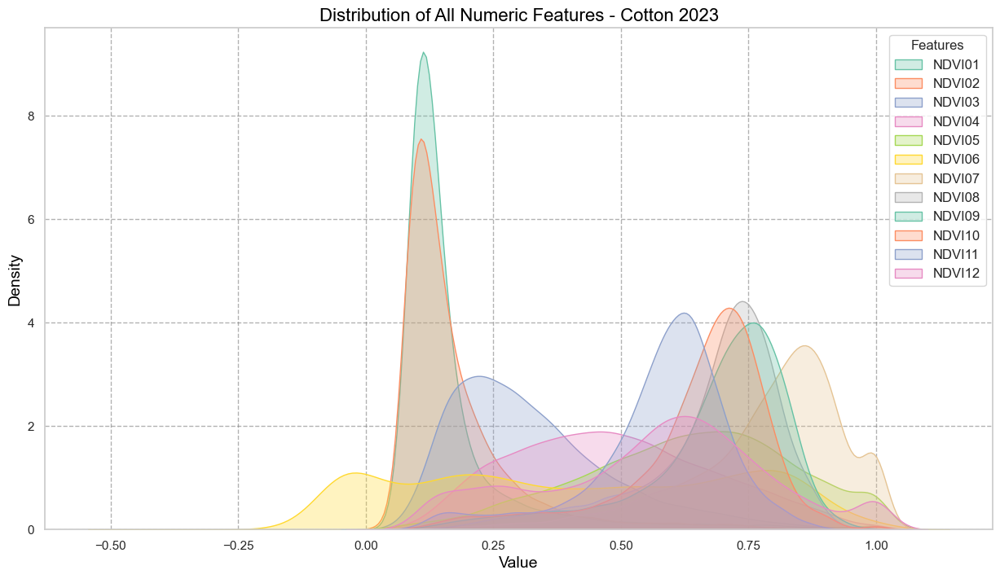

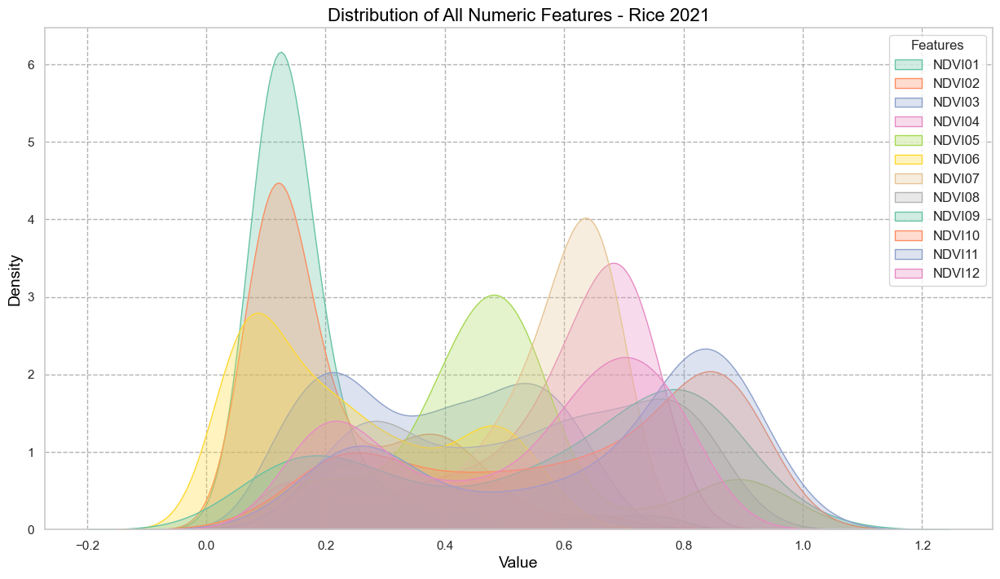

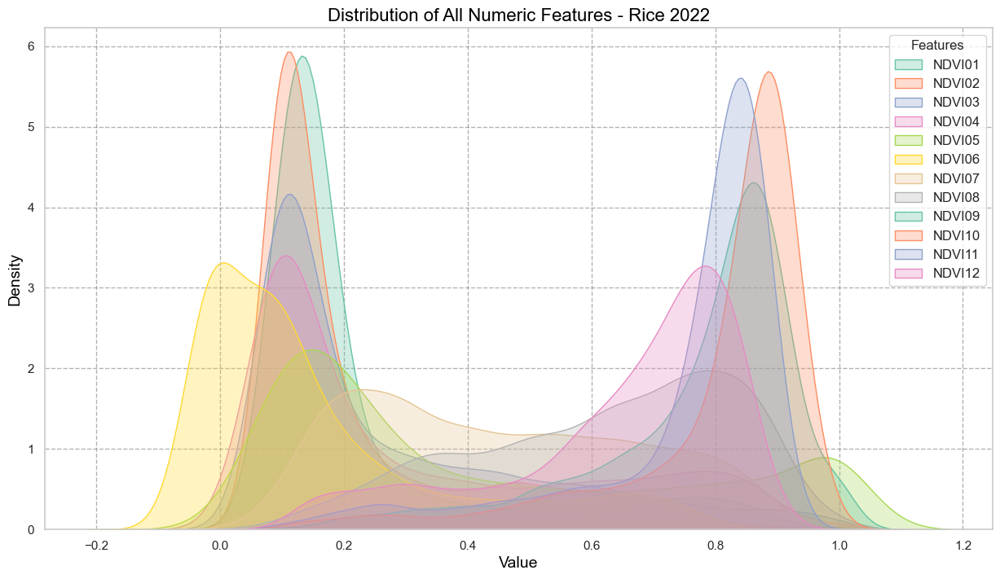

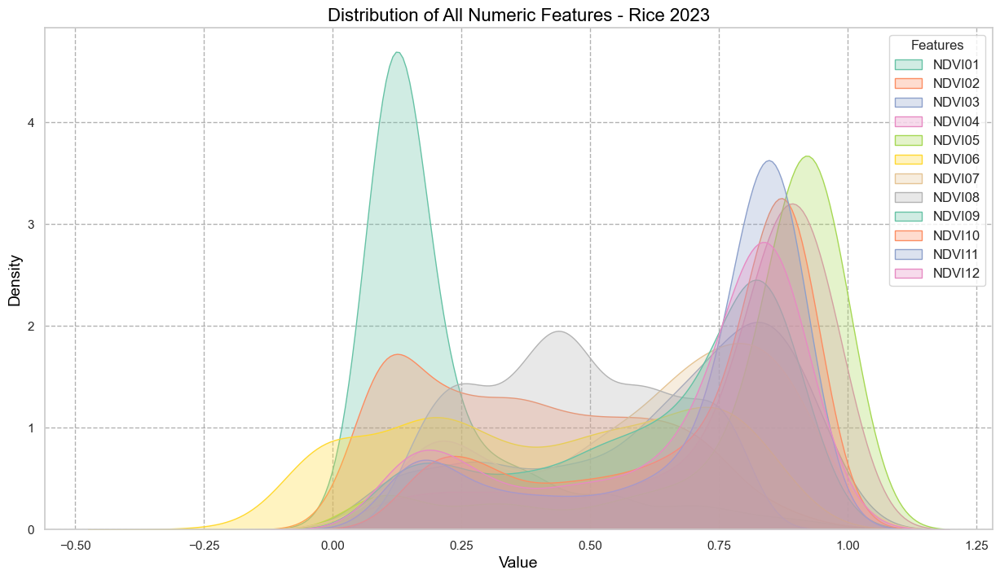

In [2957]:
# Suppress specific FutureWarnings related to seaborn's use of mode.use_inf_as_na
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn._oldcore")

# List of datasets (replace these with actual DataFrame variables)
datasets = [cotton2021, cotton2022, cotton2023, rice2021, rice2022, rice2023]

# List of dataset names for titles or labeling
dataset_names = ['Cotton 2021', 'Cotton 2022', 'Cotton 2023', 'Rice 2021', 'Rice 2022', 'Rice 2023']

# Iterate through each dataset
for idx, dataset in enumerate(datasets):
    # Extract dataset name for the title
    dataset_name = dataset_names[idx]
    
    # Define the title for the plot
    title = f"Feature Distributions - {dataset_name}"
    
    # Select numeric columns from the dataset
    numeric_features = dataset.select_dtypes(include=['number']).columns

    # Set up the figure for each dataset
    plt.figure(figsize=(15, 8))

    # Define a custom color palette
    custom_palette = sns.color_palette("Set2", n_colors=len(numeric_features))

    # Iterate through numeric features and plot their distributions with custom colors
    for i, feature in enumerate(numeric_features):
        sns.kdeplot(dataset[feature], label=feature, fill=True, alpha=0.3, color=custom_palette[i])

    # Add title and labels
    plt.title(f"Distribution of All Numeric Features - {dataset_name}", fontsize=16, color='black')
    plt.xlabel("Value", fontsize=14, color='black')
    plt.ylabel("Density", fontsize=14, color='black')

    # Display legend for each feature/column
    plt.legend(title="Features", loc='upper right', bbox_to_anchor=(1, 1), fontsize=12, title_fontsize=12)

    # Show the plot with a grid
    plt.grid(True, linestyle='--', alpha=0.6, color='gray')  # Optional: Add a gray grid for better readability

    # Show the plot for the dataset
    plt.show()


## 3.3. Histogram Plotting

This code suppresses FutureWarnings from seaborn, then generates histograms overlaid with KDE curves for each numeric feature in the provided datasets. It arranges the plots in a grid layout, adjusting the number of rows and columns based on the number of features, ensuring a neat and informative visualization for each dataset.

In [2958]:
# # Suppress specific FutureWarnings related to seaborn's use of mode.use_inf_as_na
# warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn._oldcore")

# # List of datasets (replace these with actual DataFrame variables)
# datasets = [cotton2021, cotton2022, cotton2023, rice2021, rice2022, rice2023]

# # List of dataset names for titles or labeling
# dataset_names = ['Cotton 2021', 'Cotton 2022', 'Cotton 2023', 'Rice 2021', 'Rice 2022', 'Rice 2023']

# # Iterate through each dataset
# for idx, dataset in enumerate(datasets):
#     # Extract dataset name for the title
#     dataset_name = dataset_names[idx]
    
#     # Select numeric columns from the dataset
#     numeric_features = dataset.select_dtypes(include=['number']).columns
    
#     # Calculate grid size based on the number of numeric features
#     n_features = len(numeric_features)
#     n_rows = (n_features // 3) + (n_features % 3 > 0)  # Rows needed for a 3-column layout
#     n_cols = 3  # Fixed number of columns
    
#     # Set up the figure and axes for a 4x3 grid
#     fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 5*n_rows))
    
#     # Flatten axes array for easier indexing if the number of features is less than grid size
#     axes = axes.flatten()
    
#     # Iterate through numeric features and plot histograms with KDE curve
#     for i, feature in enumerate(numeric_features):
#         ax = axes[i]
        
#         # Plot the histogram for the current feature
#         ax.hist(dataset[feature], bins=20, alpha=0.7, color='skyblue', edgecolor='black', density=True)
        
#         # Overlay the KDE curve
#         sns.kdeplot(dataset[feature], ax=ax, color='#1f77b4', linewidth=2)

#         # Add title and labels for each subplot
#         ax.set_title(f"{feature}", fontsize=12)
#         ax.set_xlabel("Value", fontsize=10)
#         ax.set_ylabel("Density", fontsize=10)  # Density instead of frequency for KDE
#         ax.grid(True, linestyle='--', alpha=0.6, color='gray')

#     # Remove any unused subplots if there are fewer features than grid slots
#     for i in range(n_features, len(axes)):
#         fig.delaxes(axes[i])

#     # Adjust layout for better spacing between subplots
#     plt.tight_layout()

#     # Add a main title for the entire dataset grid
#     fig.suptitle(f"Histograms and KDE of Numeric Features - {dataset_name}", fontsize=16, y=1.05)
    
#     # Show the plot for the dataset
#     plt.show()


## 3.4. Boxplot Plotting

This code suppresses specific FutureWarnings from seaborn and generates boxplots for each numeric feature in the datasets. It arranges the plots in a grid layout, adjusting the number of rows and columns based on the number of features, and adds labels and titles for each subplot to provide clear visual insights into the distributions and spread of the data.

In [2959]:
# # Suppress specific FutureWarnings related to seaborn's use of mode.use_inf_as_na
# warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn._oldcore")

# # List of datasets (replace these with actual DataFrame variables)
# datasets = [cotton2021, cotton2022, cotton2023, rice2021, rice2022, rice2023]

# # List of dataset names for titles or labeling
# dataset_names = ['Cotton 2021', 'Cotton 2022', 'Cotton 2023', 'Rice 2021', 'Rice 2022', 'Rice 2023']

# # Iterate through each dataset
# for idx, dataset in enumerate(datasets):
#     # Extract dataset name for the title
#     dataset_name = dataset_names[idx]
    
#     # Select numeric columns from the dataset
#     numeric_features = dataset.select_dtypes(include=['number']).columns
    
#     # Calculate grid size based on the number of numeric features
#     n_features = len(numeric_features)
#     n_rows = (n_features // 3) + (n_features % 3 > 0)  # Rows needed for a 3-column layout
#     n_cols = 3  # Fixed number of columns
    
#     # Set up the figure and axes for a 4x3 grid
#     fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 5*n_rows))
    
#     # Flatten axes array for easier indexing if the number of features is less than grid size
#     axes = axes.flatten()
    
#     # Iterate through numeric features and plot box plots
#     for i, feature in enumerate(numeric_features):
#         ax = axes[i]
        
#         # Plot the boxplot for the current feature
#         sns.boxplot(x=dataset[feature], ax=ax, color='lightpink', width=0.5)

#         # Add title and labels for each subplot
#         ax.set_title(f"{feature}", fontsize=12)
#         ax.set_xlabel("Value", fontsize=10)
#         ax.set_ylabel("Frequency", fontsize=10)
#         ax.grid(True, linestyle='--', alpha=0.6, color='gray')

#     # Remove any unused subplots if there are fewer features than grid slots
#     for i in range(n_features, len(axes)):
#         fig.delaxes(axes[i])

#     # Adjust layout for better spacing between subplots
#     plt.tight_layout()

#     # Add a main title for the entire dataset grid
#     fig.suptitle(f"Boxplots of Numeric Features - {dataset_name}", fontsize=16, y=1.05)
    
#     # Show the plot for the dataset
#     plt.show()


## 3.5. Violin Plot Plotting

This code generates violin plots for each numeric feature in the provided datasets. It arranges the plots in a grid layout with a fixed number of columns (3) and dynamically adjusts the number of rows based on the number of features. Each plot is customized with titles, labels, and a grid, and the plots display the distribution of the numeric features with quartiles and density estimation. The layout is optimized for clear visualization, and a main title is added to each dataset's set of plots.

In [2960]:
# # Suppress specific FutureWarnings related to seaborn's use of mode.use_inf_as_na
# warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn._oldcore")

# # List of datasets (replace these with actual DataFrame variables)
# datasets = [cotton2021, cotton2022, cotton2023, rice2021, rice2022, rice2023]

# # List of dataset names for titles or labeling
# dataset_names = ['Cotton 2021', 'Cotton 2022', 'Cotton 2023', 'Rice 2021', 'Rice 2022', 'Rice 2023']

# # Iterate through each dataset
# for idx, dataset in enumerate(datasets):
#     # Extract dataset name for the title
#     dataset_name = dataset_names[idx]
    
#     # Select numeric columns from the dataset
#     numeric_features = dataset.select_dtypes(include=['number']).columns
    
#     # Calculate grid size based on the number of numeric features
#     n_features = len(numeric_features)
#     n_rows = (n_features // 3) + (n_features % 3 > 0)  # Rows needed for a 3-column layout
#     n_cols = 3  # Fixed number of columns
    
#     # Set up the figure and axes for a 4x3 grid
#     fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 5*n_rows))
    
#     # Flatten axes array for easier indexing if the number of features is less than grid size
#     axes = axes.flatten()
    
#     # Iterate through numeric features and plot violin plots
#     for i, feature in enumerate(numeric_features):
#         ax = axes[i]
        
#         # Plot the violin plot for the current feature
#         sns.violinplot(x=dataset[feature], ax=ax, color='lightgreen', inner='quart', linewidth=1.25)

#         # Add title and labels for each subplot
#         ax.set_title(f"{feature}", fontsize=12)
#         ax.set_xlabel("Value", fontsize=10)
#         ax.set_ylabel("Density", fontsize=10)  # Density instead of frequency
#         ax.grid(True, linestyle='--', alpha=0.6, color='gray')

#     # Remove any unused subplots if there are fewer features than grid slots
#     for i in range(n_features, len(axes)):
#         fig.delaxes(axes[i])

#     # Adjust layout for better spacing between subplots
#     plt.tight_layout()

#     # Add a main title for the entire dataset grid
#     fig.suptitle(f"Violin Plots of Numeric Features - {dataset_name}", fontsize=16, y=1.05)
    
#     # Show the plot for the dataset
#     plt.show()


## 3.6. Display Missing Values And Duplicates

The code checks each dataset in the datasets dictionary for duplicates and missing values, printing the results for each dataset. It uses duplicated().sum() to find duplicates and isnull().sum().sum() to count missing values, helping identify potential data issues.

In [2961]:
# List of datasets
datasets = {
    "cotton2021": cotton2021,
    "cotton2022": cotton2022,
    "cotton2023": cotton2023,
    "rice2021": rice2021,
    "rice2022": rice2022,
    "rice2023": rice2023,
}

# Function to display duplicates and missing values
def check_data_issues(datasets):
    for name, df in datasets.items():
        print(f"Dataset: {name}")
        print(f"Number of duplicates: {df.duplicated().sum()}")
        print(f"Number of missing values: {df.isnull().sum().sum()}")
        print("-" * 50)

# Check issues in datasets
check_data_issues(datasets)


Dataset: cotton2021
Number of duplicates: 537
Number of missing values: 0
--------------------------------------------------
Dataset: cotton2022
Number of duplicates: 64
Number of missing values: 0
--------------------------------------------------
Dataset: cotton2023
Number of duplicates: 1
Number of missing values: 0
--------------------------------------------------
Dataset: rice2021
Number of duplicates: 0
Number of missing values: 0
--------------------------------------------------
Dataset: rice2022
Number of duplicates: 10
Number of missing values: 0
--------------------------------------------------
Dataset: rice2023
Number of duplicates: 0
Number of missing values: 0
--------------------------------------------------


# 4. Preprocessing

## 4.1. Scaling, Impute Missing Values, Drop Duplicates, Handle Outliers

The preprocess_dataset function scales numerical features using MinMaxScaler, imputes missing values with the median, removes duplicates, and handles outliers using the IQR method. It applies these transformations to ensure the dataset is clean and ready for modeling, without modifying the original dataset.

In [2962]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import pandas as pd

# Preprocessing Function
def preprocess_dataset(dataset):
    """
    Preprocess a dataset by scaling, handling missing values, duplicates, and outliers using Z-score.
    """
    dataset = dataset.copy()  # Avoid modifying the original dataset

    # 1. Identify numerical columns
    num_cols = dataset.select_dtypes(include=[np.number]).columns

    # 2. Impute Missing Values (numerical columns with median)
    dataset[num_cols] = dataset[num_cols].fillna(dataset[num_cols].median())

    # 3. Remove Duplicates
    dataset = dataset.drop_duplicates()

    # 4. Handle Outliers using Z-score
    z_scores = np.abs((dataset[num_cols] - dataset[num_cols].mean()) / dataset[num_cols].std())
    outlier_mask = (z_scores < 3).all(axis=1)  # Keep rows where all Z-scores are < 3
    dataset = dataset[outlier_mask]

    # # 5. Scale numerical features using MinMaxScaler
    scaler = MinMaxScaler()
    dataset[num_cols] = scaler.fit_transform(dataset[num_cols])

    return dataset


## 4.2. Apply Preprocessing On Individual Datasets

In [2963]:
# Preprocess individual datasets
cotton2021 = preprocess_dataset(cotton2021)
cotton2022 = preprocess_dataset(cotton2022)
cotton2023 = preprocess_dataset(cotton2023)
rice2021 = preprocess_dataset(rice2021)
rice2022 = preprocess_dataset(rice2022)
rice2023 = preprocess_dataset(rice2023)

## 4.3. Display Datasets After Preprocessing

After preprocessing, the datasets will have scaled numerical features, imputed missing values, removed duplicates, and handled outliers. The check_data_issues function will help verify that there are no remaining duplicates in the datasets.

In [2964]:
# List of datasets
datasets = {
    "cotton2021": cotton2021,
    "cotton2022": cotton2022,
    "cotton2023": cotton2023,
    "rice2021": rice2021,
    "rice2022": rice2022,
    "rice2023": rice2023,
}

# Function to display duplicates and missing values
def check_data_issues(datasets):
    for name, df in datasets.items():
        print(f"Dataset: {name}")
        print(f"Number of duplicates: {df.duplicated().sum()}")
        print("-" * 50)

# Check issues in datasets
check_data_issues(datasets)


Dataset: cotton2021
Number of duplicates: 0
--------------------------------------------------
Dataset: cotton2022
Number of duplicates: 0
--------------------------------------------------
Dataset: cotton2023
Number of duplicates: 0
--------------------------------------------------
Dataset: rice2021
Number of duplicates: 0
--------------------------------------------------
Dataset: rice2022
Number of duplicates: 0
--------------------------------------------------
Dataset: rice2023
Number of duplicates: 0
--------------------------------------------------


## 4.4. Add Label To Individual Datasets

The label column is added to each dataset, where 0 represents cotton and 1 represents rice. This helps to differentiate between the two categories for classification or analysis purposes.

In [2965]:
# Add a label column to each dataset (0 for cotton, 1 for rice)
cotton2021['label'] = 0
rice2021['label'] = 1
cotton2022['label'] = 0
rice2022['label'] = 1
cotton2023['label'] = 0
rice2023['label'] = 1

## 4.5. Combine Datasets Yearly For Testing

The datasets for cotton and rice from each year (2021, 2022, 2023) are combined into separate dataframes. This helps to consolidate the data for easier analysis or model testing across years.

In [2966]:
# Combine the datasets for each year
year_2021_copy = pd.concat([cotton2021, rice2021], ignore_index=True)
year_2022_copy = pd.concat([cotton2022, rice2022], ignore_index=True)
year_2023_copy = pd.concat([cotton2023, rice2023], ignore_index=True)

## 4.6. Apply Augmentation

The function sliding_window_augment generates an augmented dataset by applying a sliding window approach to the input time-series dataset. It creates new rows by averaging the values within each window of the specified size, ensuring the target dataset size is met, and shuffling the augmented data.

In [2967]:
window_size = 2
def sliding_window_augment(dataset, target_size, window_size):
    """
    Augments a time-series dataset using a sliding window approach.
    
    Parameters:
    - dataset: pd.DataFrame, the input dataset (time-series format).
    - target_size: int, the desired number of rows after augmentation.
    - window_size: int, size of the sliding window.
    
    Returns:
    - augmented_data: pd.DataFrame, the augmented dataset.
    """
    augmented_data = dataset.copy()
    while len(augmented_data) < target_size:
        for i in range(len(dataset) - window_size + 1):
            window = dataset.iloc[i:i + window_size].mean(axis=0)
            augmented_data = pd.concat([augmented_data, window.to_frame().T], ignore_index=True)
            if len(augmented_data) >= target_size:
                break
    return augmented_data.sample(frac=1, random_state=42).reset_index(drop=True)


In the below code the target sizes for cotton and rice datasets are set based on the largest dataset for cotton and half of that size for rice. This ensures that the augmented rice dataset is scaled appropriately relative to cotton.

In [2968]:
# Set target sizes (matching the largest dataset for cotton and half of that for rice)
cotton_target_size = max(len(cotton2021), len(cotton2022), len(cotton2023))
rice_target_size = 4*cotton_target_size//10

The datasets for cotton and rice are augmented using the sliding window approach, with cotton datasets being scaled to the largest size and rice datasets to half of that size. This process ensures that both datasets are balanced for further analysis.

In [2969]:
# Augment datasets
cotton2021 = sliding_window_augment(cotton2021, cotton_target_size, window_size)
cotton2022 = sliding_window_augment(cotton2022, cotton_target_size, window_size)
cotton2023 = sliding_window_augment(cotton2023, cotton_target_size, window_size)

rice2021 = sliding_window_augment(rice2021, rice_target_size, window_size)
rice2022 = sliding_window_augment(rice2022, rice_target_size, window_size)
rice2023 = sliding_window_augment(rice2023, rice_target_size, window_size)

# 5. Display Datasets After Preprocessing

## 5.1. Cotton Datasets 

### 5.1.1. Cotton 2021 Dataset 

In [2970]:
cotton2021

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12,label
0,0.118654,0.061301,0.151326,0.296416,0.364417,0.483421,0.591871,0.515154,0.445364,0.295459,0.399586,0.508762,0.0
1,0.197226,0.180429,0.282701,0.568125,0.576981,0.415207,0.739863,0.700931,0.453635,0.331586,0.347205,0.525378,0.0
2,0.144007,0.136038,0.105130,0.143959,0.268391,0.116757,0.489354,0.656887,0.605676,0.496519,0.306019,0.401911,0.0
3,0.232960,0.351217,0.469578,0.529936,0.383636,0.750119,0.635616,0.836468,0.812776,0.666900,0.666229,0.604581,0.0
4,0.254293,0.380212,0.480375,0.546494,0.636995,0.222186,0.594494,0.509203,0.600470,0.625406,0.558964,0.498127,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11746,0.283380,0.117936,0.453374,0.501191,0.585758,0.679126,0.809624,0.750198,0.746447,0.607339,0.710207,0.825303,0.0
11747,0.248030,0.181558,0.357181,0.483695,0.429345,0.769365,0.714416,0.781271,0.704398,0.512517,0.462403,0.537328,0.0
11748,0.137948,0.111935,0.127903,0.317362,0.388308,0.128320,0.589235,0.585810,0.598888,0.401475,0.256306,0.376407,0.0
11749,0.265670,0.191914,0.277600,0.275100,0.415979,0.738695,0.733530,0.794076,0.616524,0.466033,0.462640,0.660912,0.0


### 5.1.2. Cotton 2022 Dataset 

In [2971]:
cotton2022

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12,label
0,0.034808,0.040377,0.024832,0.043114,0.146769,0.149037,0.374429,0.524516,0.399321,0.292412,0.245464,0.223018,0
1,0.175532,0.185437,0.226562,0.269122,0.678563,0.391193,0.395850,0.633506,0.706910,0.640491,0.491873,0.133928,0
2,0.545482,0.592162,0.398277,0.270198,0.309798,0.120292,0.395173,0.227925,0.222468,0.243139,0.250041,0.233367,0
3,0.660228,0.378799,0.379370,0.352096,0.529348,0.491382,0.629837,0.567934,0.430877,0.444575,0.416306,0.339733,0
4,0.172566,0.115839,0.083750,0.080634,0.152332,0.445368,0.336307,0.250035,0.137569,0.086032,0.075962,0.078739,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11746,0.260479,0.246325,0.565136,0.546157,0.522785,0.180336,0.751523,0.715302,0.738112,0.666229,0.667271,0.515133,0
11747,0.301389,0.304676,0.280223,0.456340,0.712512,0.693814,0.597672,0.602409,0.597172,0.572519,0.525523,0.182137,0
11748,0.159018,0.295494,0.429514,0.646055,0.951007,0.968949,1.000000,0.909462,0.846290,0.785956,0.666934,0.729460,0
11749,0.122488,0.145736,0.512197,0.595579,0.524088,0.749565,0.203945,0.825276,0.752948,0.718999,0.538522,0.515043,0


### 5.1.3. Cotton 2023 Dataset 

In [2972]:
cotton2023

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12,label
0,0.121185,0.121326,0.242163,0.561443,0.731940,0.761886,0.775566,0.596933,0.597863,0.585926,0.617199,0.764295,0.0
1,0.175690,0.129444,0.127606,0.165066,0.837510,0.586746,0.843034,0.622596,0.576916,0.217907,0.297971,0.067398,0.0
2,0.428108,0.431751,0.564656,0.550961,0.578461,0.673456,0.553740,0.446206,0.520343,0.553828,0.599034,0.740034,0.0
3,0.138639,0.149708,0.208710,0.071141,0.149012,0.523083,0.320732,0.260344,0.113060,0.325646,0.269443,0.348301,0.0
4,0.453020,0.365634,0.505016,0.469600,0.548364,0.351604,0.508584,0.494197,0.544754,0.554118,0.574080,1.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11746,0.085979,0.138067,0.363334,0.629341,0.763689,0.587020,1.000000,0.616463,0.633664,0.492983,0.340091,0.482829,0.0
11747,0.185946,0.233355,0.419440,0.691181,0.740411,0.239186,0.773033,0.631988,0.612983,0.565733,0.500035,0.366484,0.0
11748,0.310626,0.141907,0.340526,0.279380,0.664471,0.273002,0.875508,0.707230,0.639933,0.509325,0.561779,0.596301,0.0
11749,0.114036,0.171617,0.440163,0.459691,0.701543,0.276729,1.000000,0.588582,0.526722,0.570845,0.468414,0.607931,0.0


## 5.2. Rice Datasets 

### 5.2.1. Rice 2021 Datasets 

In [2973]:
rice2021

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12,label
0,0.151105,0.131455,0.249875,0.689600,0.418414,0.251998,0.879284,0.425913,0.104333,0.490246,0.552053,0.436427,1.0
1,0.147911,0.118613,0.279504,0.758448,0.500466,0.596632,0.900347,0.810120,0.566763,0.397650,0.119945,0.089860,1.0
2,0.179099,0.093819,0.217694,0.052320,0.139750,0.121127,0.241836,0.594609,0.770867,0.784887,0.674596,0.282938,1.0
3,0.138201,0.090302,0.419116,0.597846,0.557667,0.282028,0.704004,0.160374,0.219783,0.637264,0.753463,0.773236,1.0
4,0.142747,0.207664,0.656458,0.787303,0.415414,0.083347,0.751576,0.561906,0.583498,0.552782,0.487939,0.450456,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4695,0.509965,0.241178,0.365239,0.741839,0.517900,0.051449,0.680641,0.621298,0.567213,0.291527,0.500226,0.580154,1.0
4696,0.509965,0.241178,0.365239,0.741839,0.517900,0.051449,0.680641,0.621298,0.567213,0.291527,0.500226,0.580154,1.0
4697,0.225933,0.728277,0.934458,0.924889,0.453386,0.287176,0.348762,0.760004,0.847120,0.989773,0.931415,0.669366,1.0
4698,0.560081,0.575369,0.749603,0.820180,0.394587,0.219877,0.219394,0.676735,0.757269,0.865672,0.812480,0.860970,1.0


### 5.2.2. Rice 2022 Datasets 

In [2974]:
rice2022

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12,label
0,0.577421,0.542211,0.236937,0.137094,0.254002,0.269566,0.176272,0.650758,0.868470,0.876120,0.944393,0.846892,1.0
1,0.165745,0.192253,0.442162,0.659591,0.194425,0.178770,0.117386,0.653868,0.820916,0.862898,0.870276,0.790766,1.0
2,0.127835,0.119384,0.035923,0.170746,0.143937,0.160913,0.679583,0.844424,0.797384,0.959225,0.921176,0.744625,1.0
3,0.148522,0.158780,0.127971,0.106583,0.179989,0.187388,0.320835,0.832861,0.817811,0.828591,0.860622,0.752296,1.0
4,0.112684,0.128210,0.086019,0.134611,0.432337,0.415536,0.643417,0.675786,0.837619,0.807869,0.837167,0.672783,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4695,0.066306,0.055808,0.041497,0.055551,0.207432,0.255261,0.244807,0.383168,0.707450,0.850534,0.865973,0.760016,1.0
4696,0.108675,0.079761,0.187880,0.370065,0.564184,0.147472,0.252296,0.625214,0.781155,0.879156,0.881608,0.849875,1.0
4697,0.146749,0.136575,0.385466,0.568606,0.649656,0.531646,0.875194,0.878147,0.857741,0.826906,0.865897,0.791669,1.0
4698,0.128960,0.057731,0.140766,0.214668,0.932291,0.644949,0.526890,0.674850,0.504382,0.399410,0.364636,0.349329,1.0


### 5.2.3. Rice 2023 Datasets 

In [2975]:
rice2023

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12,label
0,0.438597,0.316300,0.374884,0.432014,0.419272,0.481000,0.155363,0.400690,0.746761,0.855943,0.865624,0.767014,1.0
1,0.195543,0.415924,0.700284,0.838162,0.911494,0.707797,0.533538,0.310666,0.395634,0.706186,0.896971,0.840245,1.0
2,0.329301,0.213826,0.369131,0.499033,0.567035,0.669271,0.543406,0.424576,0.405851,0.451397,0.389512,0.439979,1.0
3,0.238439,0.345610,0.347698,0.608881,0.936907,0.835926,0.843794,0.513079,0.370169,0.543718,0.745100,0.739242,1.0
4,0.166712,0.426479,0.814601,0.882625,0.877634,0.685400,0.760743,0.572928,0.783517,0.860149,0.917568,0.733996,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4695,0.170372,0.214903,0.456247,0.565918,0.581942,0.665656,0.431914,0.556848,0.813830,0.855207,0.832326,0.728395,1.0
4696,0.276593,0.224912,0.230012,0.372804,0.382773,0.324138,0.941800,0.406023,0.291365,0.347387,0.364611,0.586732,1.0
4697,0.156698,0.196449,0.847554,0.898247,0.922406,0.427879,0.737085,0.315820,0.775798,0.862754,0.848532,0.859472,1.0
4698,0.149846,0.266664,0.828586,0.930202,0.933403,0.157839,0.663343,0.145346,0.652400,0.768528,0.869807,0.818075,1.0


## 5.3. Plotting NDVI

After preprocessing, the datasets are augmented using a sliding window approach to balance the size of the datasets. The resulting datasets are then used to plot the average NDVI values across the columns (NDVI01 to NDVI12) for each year, helping visualize the trends in both cotton and rice datasets.

<Figure size 2000x800 with 0 Axes>

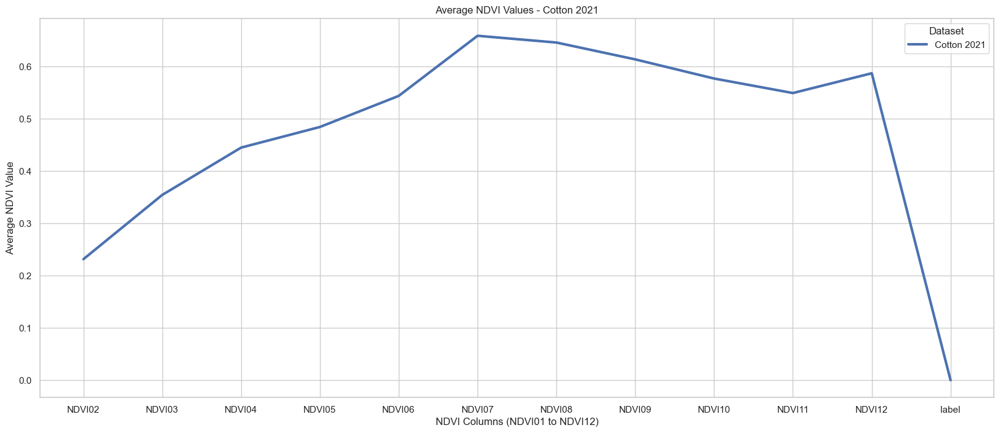

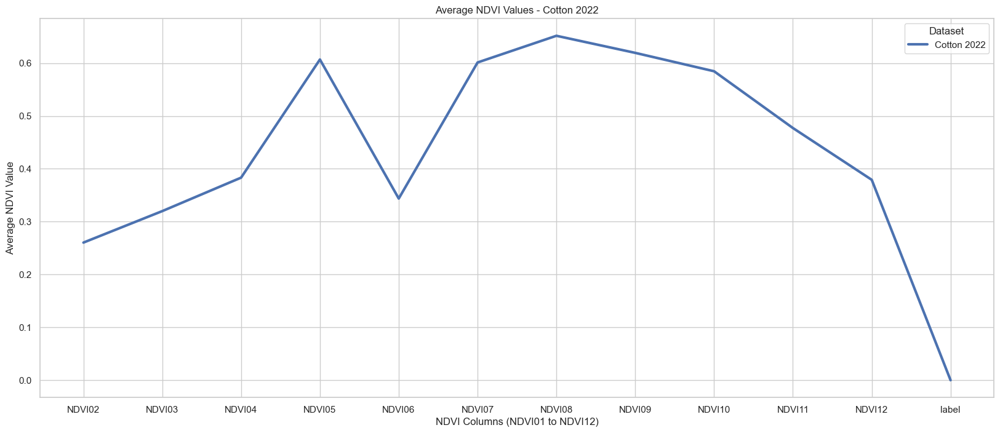

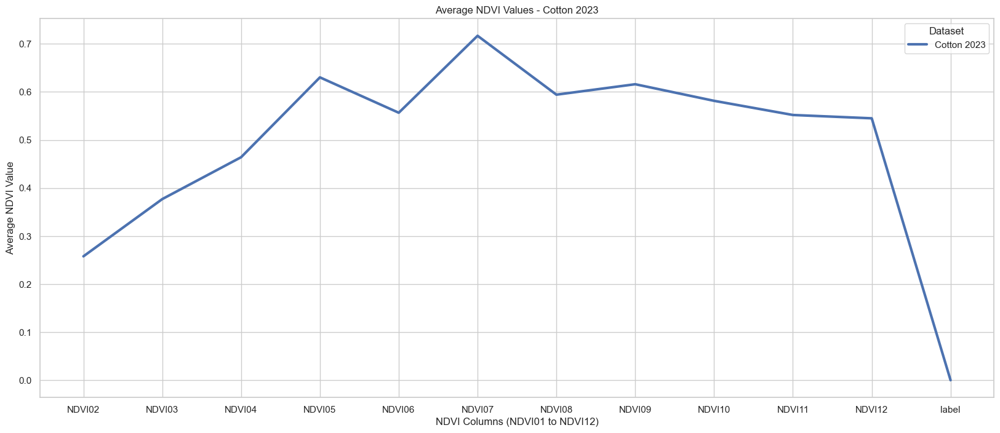

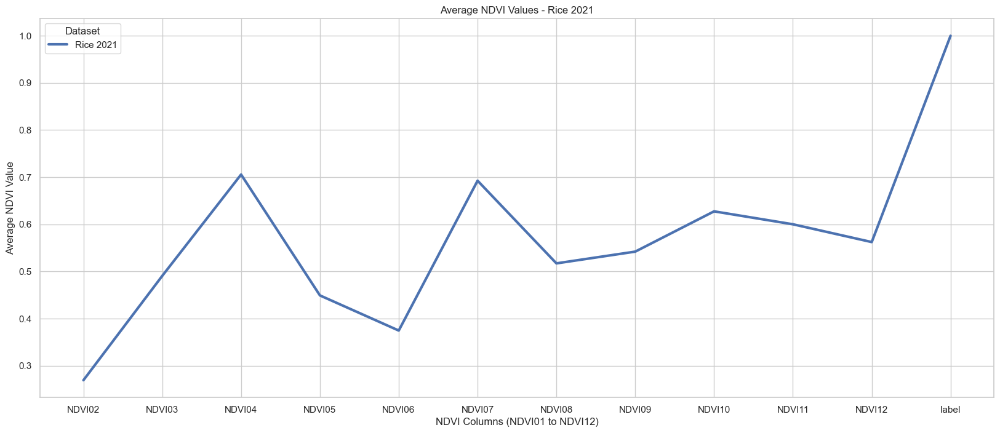

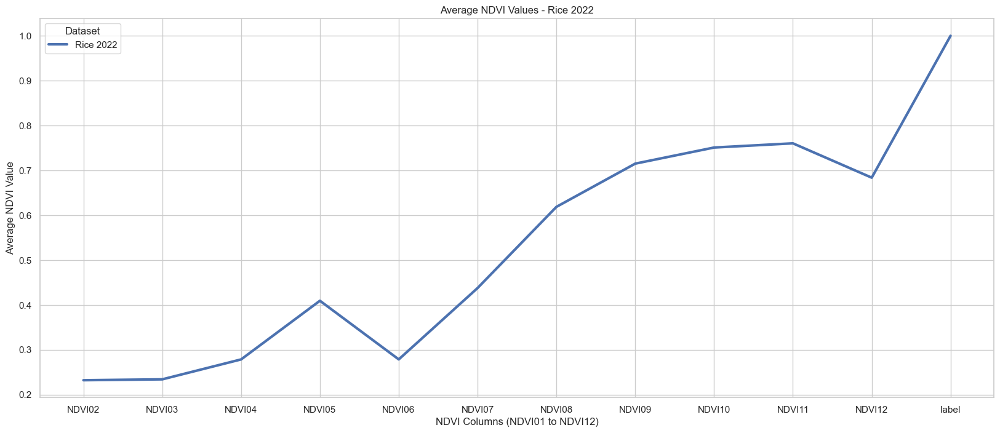

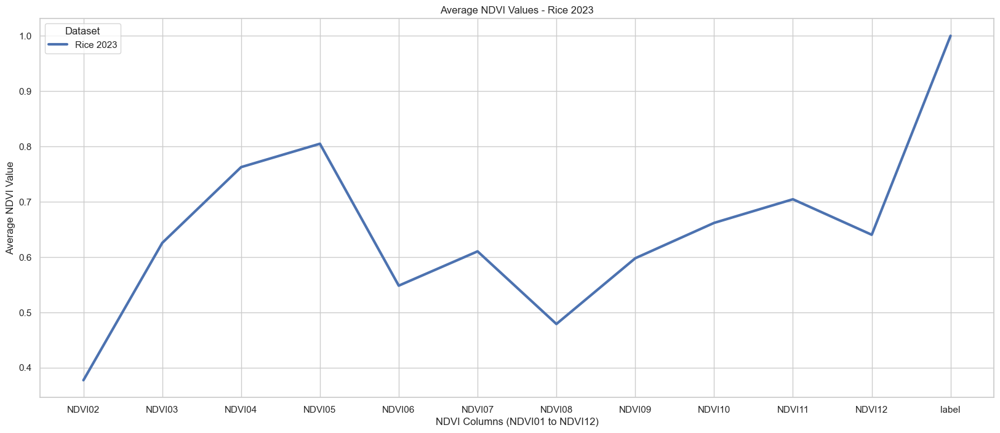

In [2976]:
# List of dataset names (replace these with actual DataFrame variables)
datasets = [cotton2021, cotton2022, cotton2023, rice2021, rice2022, rice2023]

# List of dataset names for titles or labeling
dataset_names = ['Cotton 2021', 'Cotton 2022', 'Cotton 2023', 'Rice 2021', 'Rice 2022', 'Rice 2023']

# Set up the plot figure
plt.figure(figsize=(20, 8))

# Iterate over each dataset
for idx, dataset in enumerate(datasets):
    # Extract dataset name for the title
    dataset_name = dataset_names[idx]
    
    # Compute the average NDVI values across all columns (assuming NDVI columns are from NDVI01 to NDVI12)
    # Assuming NDVI columns start from the second column onwards
    avg_ndvi = dataset.iloc[:, 1:].mean()  # Exclude the first column if it's not part of NDVI columns
    
    # Set up the figure for each dataset
    plt.figure(figsize=(20, 8))
    
    # Plot the average NDVI values across columns for the dataset
    plt.plot(avg_ndvi.index, avg_ndvi.values, label=dataset_name, linewidth=3)  # Increased linewidth
    
    # Add labels and title to the plot
    plt.title(f'Average NDVI Values - {dataset_name}')
    plt.xlabel('NDVI Columns (NDVI01 to NDVI12)')
    plt.ylabel('Average NDVI Value')
    plt.legend(title='Dataset', loc='best')
    plt.grid(True)
    
    # Show the plot for this dataset
    plt.show()


## 5.4. Plotting Distribution

After preprocessing, which involved handling missing values, scaling numeric features, removing duplicates, and addressing outliers, the datasets are now ready for visual analysis. The feature distributions for each dataset are plotted to understand the underlying patterns and density of numeric features, providing insights into the data's characteristics.

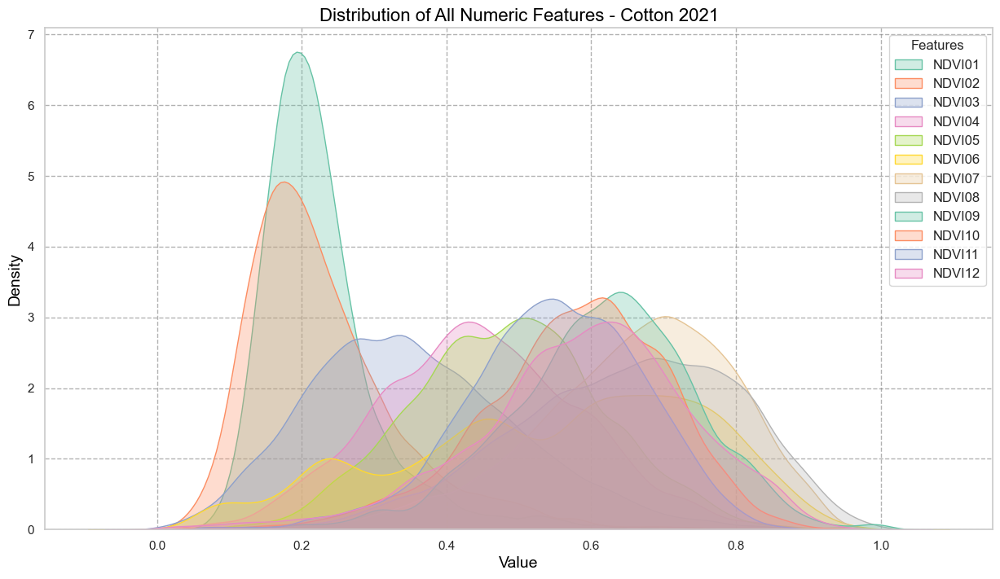

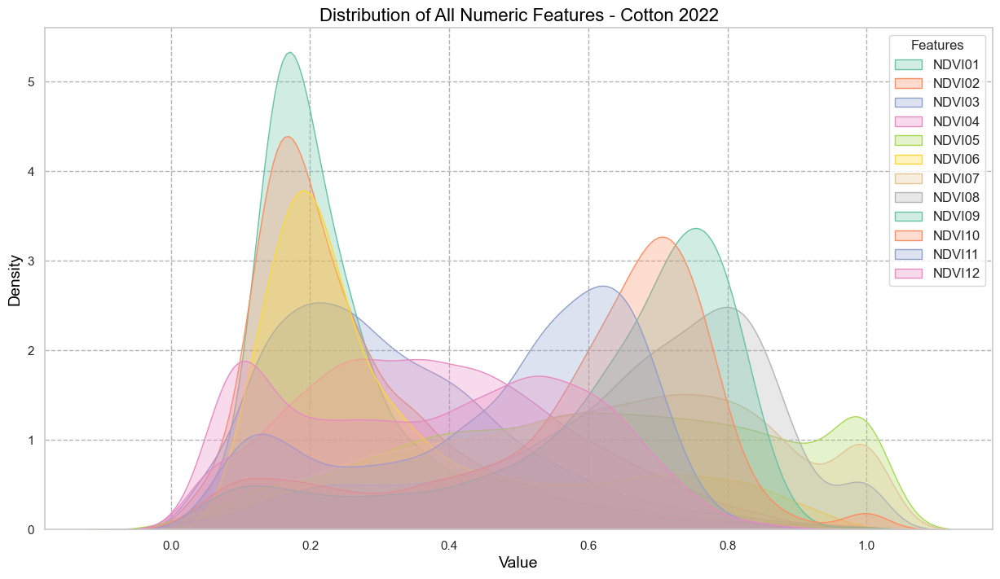

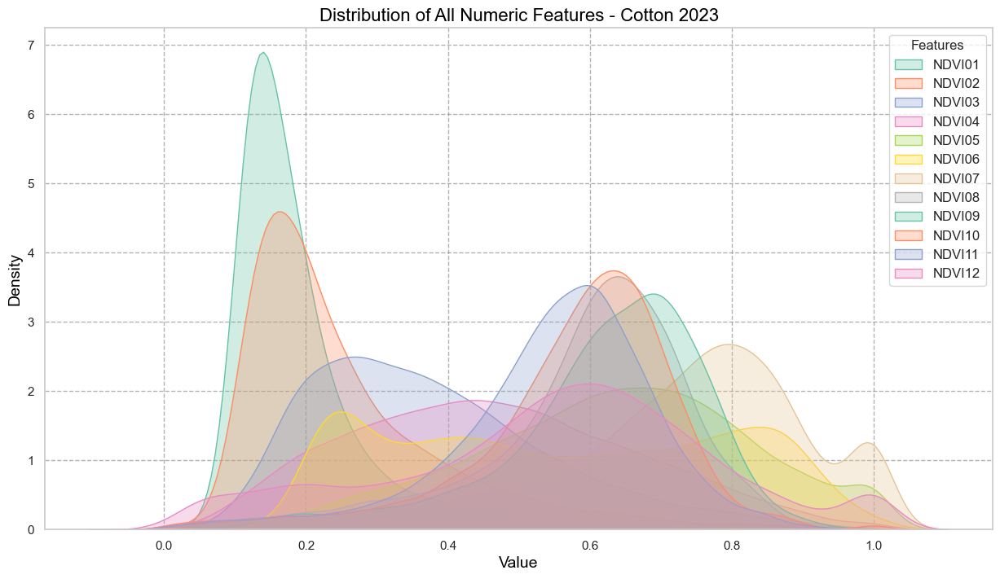

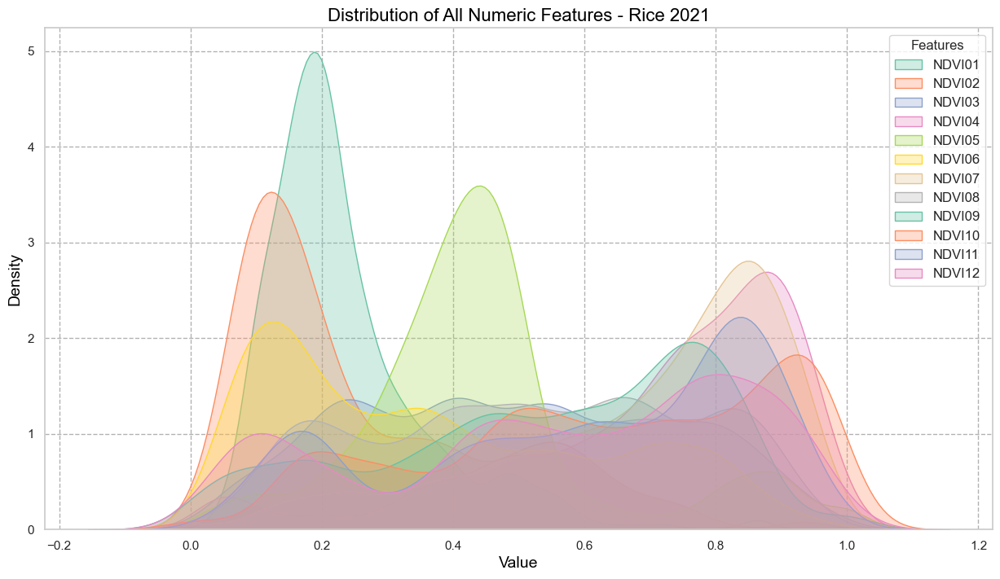

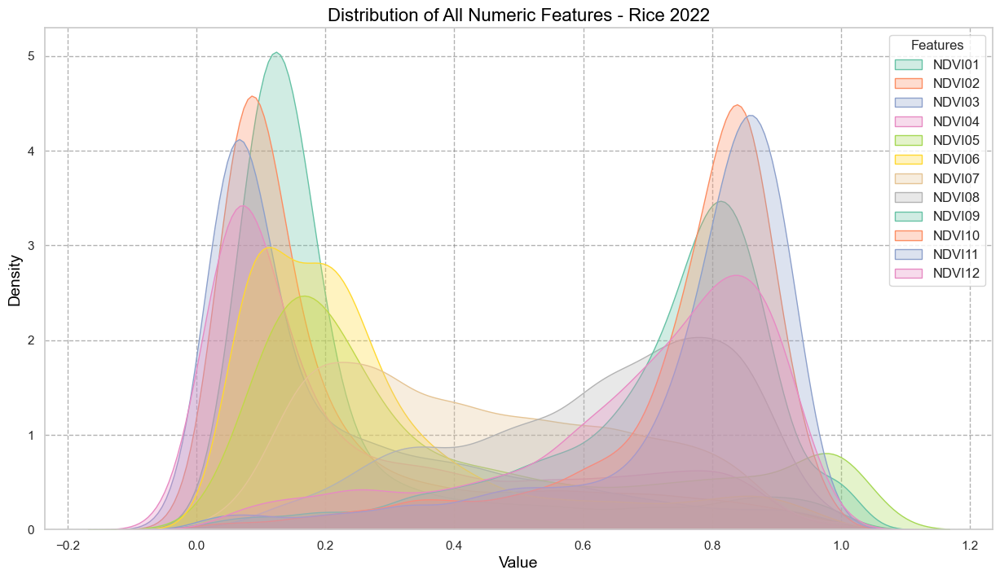

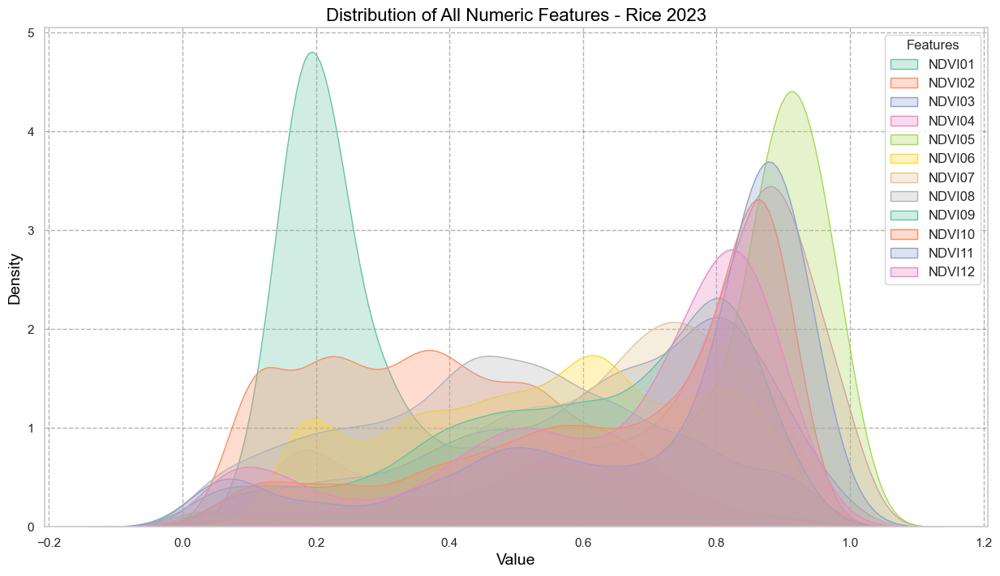

In [2977]:
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn._oldcore")

# List of datasets
datasets = [cotton2021, cotton2022, cotton2023, rice2021, rice2022, rice2023]

# List of dataset names for titles or labeling
dataset_names = ['Cotton 2021', 'Cotton 2022', 'Cotton 2023', 'Rice 2021', 'Rice 2022', 'Rice 2023']

# Iterate through each dataset
for idx, dataset in enumerate(datasets):
    # Extract dataset name for the title
    dataset_name = dataset_names[idx]
    
    # Define the title for the plot
    title = f"Feature Distributions - {dataset_name}"
    
    # Select numeric columns from the dataset
    numeric_features = dataset.select_dtypes(include=['number']).columns

    # Set up the figure for each dataset
    plt.figure(figsize=(15, 8))

    # Define a custom color palette
    custom_palette = sns.color_palette("Set2", n_colors=len(numeric_features))

    # Iterate through numeric features and plot their distributions with custom colors
    for i, feature in enumerate(numeric_features):
        sns.kdeplot(dataset[feature], label=feature, fill=True, alpha=0.3, color=custom_palette[i])

    # Add title and labels
    plt.title(f"Distribution of All Numeric Features - {dataset_name}", fontsize=16, color='black')
    plt.xlabel("Value", fontsize=14, color='black')
    plt.ylabel("Density", fontsize=14, color='black')

    # Display legend for each feature/column
    plt.legend(title="Features", loc='upper right', bbox_to_anchor=(1, 1), fontsize=12, title_fontsize=12)

    # Show the plot with a grid
    plt.grid(True, linestyle='--', alpha=0.6, color='gray')  

    # Show the plot for the dataset
    plt.show()


## 5.5. Histogram Plotting 

After preprocessing, the datasets are ready for detailed feature exploration. Histograms and KDE plots are generated for each numeric feature, providing a visual understanding of their distributions, including density estimation. This helps in identifying patterns, trends, and potential issues in the data.

In [ ]:
# Suppress specific FutureWarnings related to seaborn's use of mode.use_inf_as_na
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn._oldcore")

# List of datasets
datasets = [cotton2021, cotton2022, cotton2023, rice2021, rice2022, rice2023]

# List of dataset names for titles or labeling
dataset_names = ['Cotton 2021', 'Cotton 2022', 'Cotton 2023', 'Rice 2021', 'Rice 2022', 'Rice 2023']

# Iterate through each dataset
for idx, dataset in enumerate(datasets):
    # Extract dataset name for the title
    dataset_name = dataset_names[idx]
    
    # Select numeric columns from the dataset
    numeric_features = dataset.select_dtypes(include=['number']).columns
    
    # Calculate grid size based on the number of numeric features
    n_features = len(numeric_features)
    n_rows = (n_features // 3) + (n_features % 3 > 0)  # Rows needed for a 3-column layout
    n_cols = 3  # Fixed number of columns
    
    # Set up the figure and axes for a 4x3 grid
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 5*n_rows))
    
    # Flatten axes array for easier indexing if the number of features is less than grid size
    axes = axes.flatten()
    
    # Iterate through numeric features and plot histograms with KDE curve
    for i, feature in enumerate(numeric_features):
        ax = axes[i]
        
        # Plot the histogram for the current feature
        ax.hist(dataset[feature], bins=20, alpha=0.7, color='skyblue', edgecolor='black', density=True)
        
        # Overlay the KDE curve
        sns.kdeplot(dataset[feature], ax=ax, color='#1f77b4', linewidth=2)

        # Add title and labels for each subplot
        ax.set_title(f"{feature}", fontsize=12)
        ax.set_xlabel("Value", fontsize=10)
        ax.set_ylabel("Density", fontsize=10)  # Density instead of frequency for KDE
        ax.grid(True, linestyle='--', alpha=0.6, color='gray')

    # Remove any unused subplots if there are fewer features than grid slots
    for i in range(n_features, len(axes)):
        fig.delaxes(axes[i])

    # Adjust layout for better spacing between subplots
    plt.tight_layout()

    # Add a main title for the entire dataset grid
    fig.suptitle(f"Histograms and KDE of Numeric Features - {dataset_name}", fontsize=16, y=1.05)
    
    # Show the plot for the dataset
    plt.show()


## 5.6. Boxplot Plotting 

After preprocessing, the datasets are visualized using boxplots to examine the distribution of numeric features. These plots help identify outliers and provide a clear view of the spread and central tendency of the data, offering insights into potential data anomalies or variations across different datasets.

In [ ]:
# Suppress specific FutureWarnings related to seaborn's use of mode.use_inf_as_na
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn._oldcore")

# List of datasets 
datasets = [cotton2021, cotton2022, cotton2023, rice2021, rice2022, rice2023]

# List of dataset names for titles or labeling
dataset_names = ['Cotton 2021', 'Cotton 2022', 'Cotton 2023', 'Rice 2021', 'Rice 2022', 'Rice 2023']

# Iterate through each dataset
for idx, dataset in enumerate(datasets):
    # Extract dataset name for the title
    dataset_name = dataset_names[idx]
    
    # Select numeric columns from the dataset
    numeric_features = dataset.select_dtypes(include=['number']).columns
    
    # Calculate grid size based on the number of numeric features
    n_features = len(numeric_features)
    n_rows = (n_features // 3) + (n_features % 3 > 0)  # Rows needed for a 3-column layout
    n_cols = 3  # Fixed number of columns
    
    # Set up the figure and axes for a 4x3 grid
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 5*n_rows))
    
    # Flatten axes array for easier indexing if the number of features is less than grid size
    axes = axes.flatten()
    
    # Iterate through numeric features and plot box plots
    for i, feature in enumerate(numeric_features):
        ax = axes[i]
        
        # Plot the boxplot for the current feature
        sns.boxplot(x=dataset[feature], ax=ax, color='lightpink', width=0.5)

        # Add title and labels for each subplot
        ax.set_title(f"{feature}", fontsize=12)
        ax.set_xlabel("Value", fontsize=10)
        ax.set_ylabel("Frequency", fontsize=10)
        ax.grid(True, linestyle='--', alpha=0.6, color='gray')

    # Remove any unused subplots if there are fewer features than grid slots
    for i in range(n_features, len(axes)):
        fig.delaxes(axes[i])

    # Adjust layout for better spacing between subplots
    plt.tight_layout()

    # Add a main title for the entire dataset grid
    fig.suptitle(f"Boxplots of Numeric Features - {dataset_name}", fontsize=16, y=1.05)
    
    # Show the plot for the dataset
    plt.show()


## 5.7. Violin Plot Plotting 

After preprocessing, the datasets are visualized using violin plots to explore the distribution and density of numeric features. These plots provide insights into the spread, skewness, and the presence of outliers, helping to understand the underlying data distribution for each feature across different datasets.

In [ ]:
# Suppress specific FutureWarnings related to seaborn's use of mode.use_inf_as_na
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn._oldcore")

# List of datasets (replace these with actual DataFrame variables)
datasets = [cotton2021, cotton2022, cotton2023, rice2021, rice2022, rice2023]

# List of dataset names for titles or labeling
dataset_names = ['Cotton 2021', 'Cotton 2022', 'Cotton 2023', 'Rice 2021', 'Rice 2022', 'Rice 2023']

# Iterate through each dataset
for idx, dataset in enumerate(datasets):
    # Extract dataset name for the title
    dataset_name = dataset_names[idx]
    
    # Select numeric columns from the dataset
    numeric_features = dataset.select_dtypes(include=['number']).columns
    
    # Calculate grid size based on the number of numeric features
    n_features = len(numeric_features)
    n_rows = (n_features // 3) + (n_features % 3 > 0)  # Rows needed for a 3-column layout
    n_cols = 3  # Fixed number of columns
    
    # Set up the figure and axes for a 4x3 grid
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 5*n_rows))
    
    # Flatten axes array for easier indexing if the number of features is less than grid size
    axes = axes.flatten()
    
    # Iterate through numeric features and plot violin plots
    for i, feature in enumerate(numeric_features):
        ax = axes[i]
        
        # Plot the violin plot for the current feature
        sns.violinplot(x=dataset[feature], ax=ax, color='lightgreen', inner='quart', linewidth=1.25)

        # Add title and labels for each subplot
        ax.set_title(f"{feature}", fontsize=12)
        ax.set_xlabel("Value", fontsize=10)
        ax.set_ylabel("Density", fontsize=10)  # Density instead of frequency
        ax.grid(True, linestyle='--', alpha=0.6, color='gray')

    # Remove any unused subplots if there are fewer features than grid slots
    for i in range(n_features, len(axes)):
        fig.delaxes(axes[i])

    # Adjust layout for better spacing between subplots
    plt.tight_layout()

    # Add a main title for the entire dataset grid
    fig.suptitle(f"Violin Plots of Numeric Features - {dataset_name}", fontsize=16, y=1.05)
    
    # Show the plot for the dataset
    plt.show()


# 6. Combine Datasets

## 6.1. Combine Datasets Yearly For Training

The datasets for cotton and rice from each year (2021, 2022, 2023) are labeled with 0 for cotton and 1 for rice. These labeled datasets are then combined for each year, creating three unified datasets representing the years 2021, 2022, and 2023 for further analysis.

In [2981]:
# Add a label column to each dataset (0 for cotton, 1 for rice)
cotton2021['label'] = 0
rice2021['label'] = 1
cotton2022['label'] = 0
rice2022['label'] = 1
cotton2023['label'] = 0
rice2023['label'] = 1

# Combine the datasets for each year
year_2021 = pd.concat([cotton2021, rice2021], ignore_index=True)
year_2022 = pd.concat([cotton2022, rice2022], ignore_index=True)
year_2023 = pd.concat([cotton2023, rice2023], ignore_index=True)

## 6.2. Display Datasets Yearly

### 6.2.1. Display Dataset 2021 Yearly

In [2982]:
year_2021

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12,label
0,0.118654,0.061301,0.151326,0.296416,0.364417,0.483421,0.591871,0.515154,0.445364,0.295459,0.399586,0.508762,0
1,0.197226,0.180429,0.282701,0.568125,0.576981,0.415207,0.739863,0.700931,0.453635,0.331586,0.347205,0.525378,0
2,0.144007,0.136038,0.105130,0.143959,0.268391,0.116757,0.489354,0.656887,0.605676,0.496519,0.306019,0.401911,0
3,0.232960,0.351217,0.469578,0.529936,0.383636,0.750119,0.635616,0.836468,0.812776,0.666900,0.666229,0.604581,0
4,0.254293,0.380212,0.480375,0.546494,0.636995,0.222186,0.594494,0.509203,0.600470,0.625406,0.558964,0.498127,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16446,0.509965,0.241178,0.365239,0.741839,0.517900,0.051449,0.680641,0.621298,0.567213,0.291527,0.500226,0.580154,1
16447,0.509965,0.241178,0.365239,0.741839,0.517900,0.051449,0.680641,0.621298,0.567213,0.291527,0.500226,0.580154,1
16448,0.225933,0.728277,0.934458,0.924889,0.453386,0.287176,0.348762,0.760004,0.847120,0.989773,0.931415,0.669366,1
16449,0.560081,0.575369,0.749603,0.820180,0.394587,0.219877,0.219394,0.676735,0.757269,0.865672,0.812480,0.860970,1


### 6.2.2. Display Dataset 2022 Yearly

In [2983]:
year_2022

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12,label
0,0.034808,0.040377,0.024832,0.043114,0.146769,0.149037,0.374429,0.524516,0.399321,0.292412,0.245464,0.223018,0
1,0.175532,0.185437,0.226562,0.269122,0.678563,0.391193,0.395850,0.633506,0.706910,0.640491,0.491873,0.133928,0
2,0.545482,0.592162,0.398277,0.270198,0.309798,0.120292,0.395173,0.227925,0.222468,0.243139,0.250041,0.233367,0
3,0.660228,0.378799,0.379370,0.352096,0.529348,0.491382,0.629837,0.567934,0.430877,0.444575,0.416306,0.339733,0
4,0.172566,0.115839,0.083750,0.080634,0.152332,0.445368,0.336307,0.250035,0.137569,0.086032,0.075962,0.078739,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16446,0.066306,0.055808,0.041497,0.055551,0.207432,0.255261,0.244807,0.383168,0.707450,0.850534,0.865973,0.760016,1
16447,0.108675,0.079761,0.187880,0.370065,0.564184,0.147472,0.252296,0.625214,0.781155,0.879156,0.881608,0.849875,1
16448,0.146749,0.136575,0.385466,0.568606,0.649656,0.531646,0.875194,0.878147,0.857741,0.826906,0.865897,0.791669,1
16449,0.128960,0.057731,0.140766,0.214668,0.932291,0.644949,0.526890,0.674850,0.504382,0.399410,0.364636,0.349329,1


### 6.2.3. Display Dataset 2023 Yearly

In [2984]:
year_2023

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12,label
0,0.121185,0.121326,0.242163,0.561443,0.731940,0.761886,0.775566,0.596933,0.597863,0.585926,0.617199,0.764295,0
1,0.175690,0.129444,0.127606,0.165066,0.837510,0.586746,0.843034,0.622596,0.576916,0.217907,0.297971,0.067398,0
2,0.428108,0.431751,0.564656,0.550961,0.578461,0.673456,0.553740,0.446206,0.520343,0.553828,0.599034,0.740034,0
3,0.138639,0.149708,0.208710,0.071141,0.149012,0.523083,0.320732,0.260344,0.113060,0.325646,0.269443,0.348301,0
4,0.453020,0.365634,0.505016,0.469600,0.548364,0.351604,0.508584,0.494197,0.544754,0.554118,0.574080,1.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16446,0.170372,0.214903,0.456247,0.565918,0.581942,0.665656,0.431914,0.556848,0.813830,0.855207,0.832326,0.728395,1
16447,0.276593,0.224912,0.230012,0.372804,0.382773,0.324138,0.941800,0.406023,0.291365,0.347387,0.364611,0.586732,1
16448,0.156698,0.196449,0.847554,0.898247,0.922406,0.427879,0.737085,0.315820,0.775798,0.862754,0.848532,0.859472,1
16449,0.149846,0.266664,0.828586,0.930202,0.933403,0.157839,0.663343,0.145346,0.652400,0.768528,0.869807,0.818075,1


## 6.3. Plotting NDVI

The average NDVI values for each dataset (2021, 2022, and 2023) are calculated by averaging the NDVI values across all relevant columns. These average values are then plotted for each year to visualize the trends in NDVI across the 12 columns, with each year displayed as a separate plot.

<Figure size 2000x800 with 0 Axes>

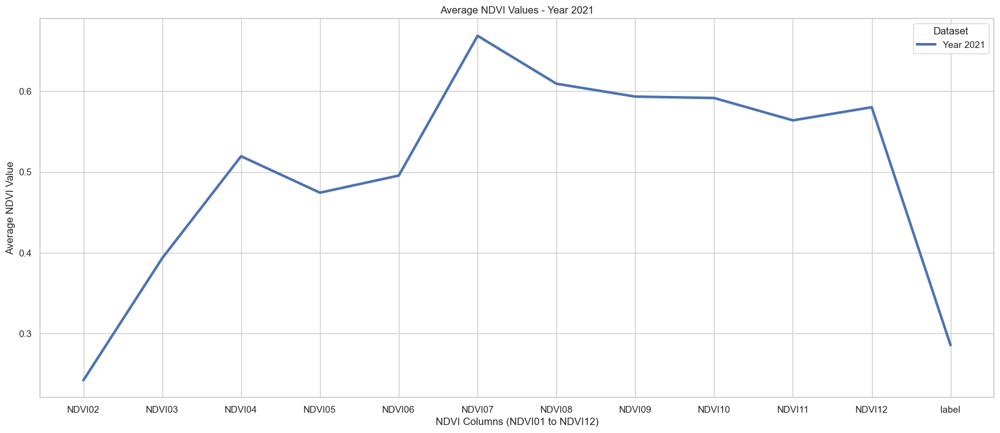

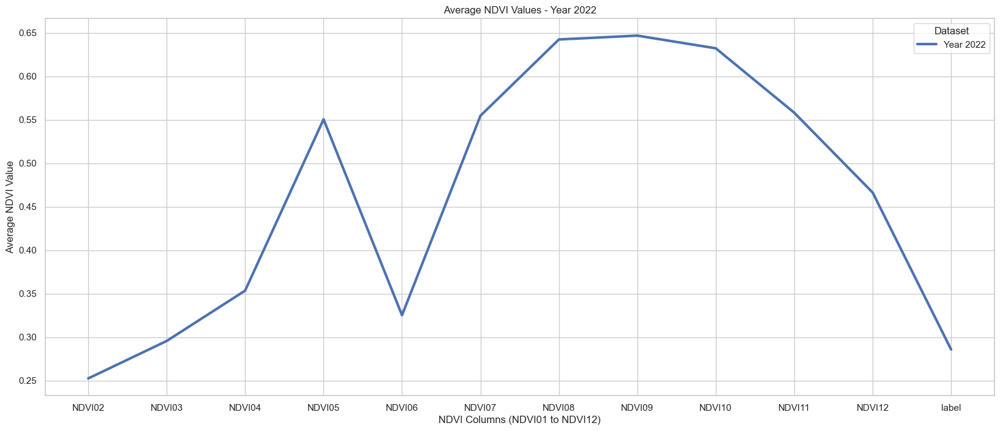

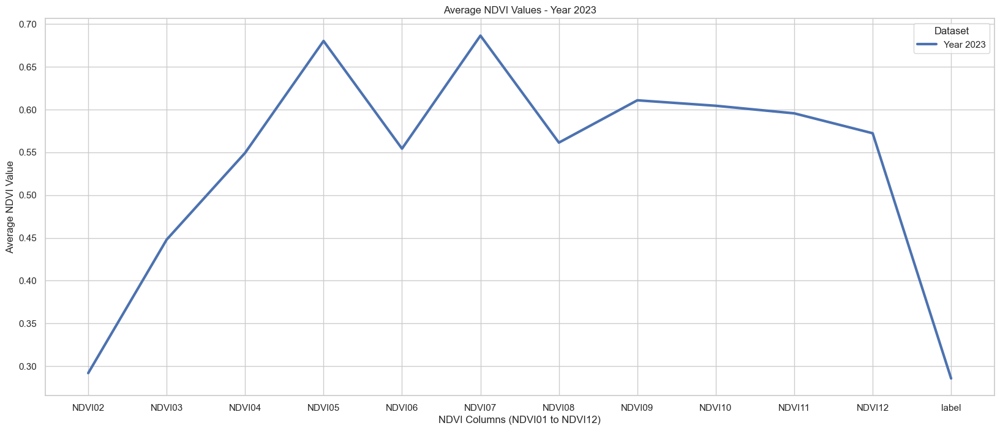

In [2985]:
# List of dataset names 
datasets = [year_2021, year_2022, year_2023]

# List of dataset names for titles or labeling
dataset_names = ['Year 2021', 'Year 2022', 'Year 2023']

# Set up the plot figure
plt.figure(figsize=(20, 8))

# Iterate over each dataset
for idx, dataset in enumerate(datasets):
    # Extract dataset name for the title
    dataset_name = dataset_names[idx]
    
    # Compute the average NDVI values across all columns (assuming NDVI columns are from NDVI01 to NDVI12)
    # Assuming NDVI columns start from the second column onwards
    avg_ndvi = dataset.iloc[:, 1:].mean()  # Exclude the first column if it's not part of NDVI columns
    
    # Set up the figure for each dataset
    plt.figure(figsize=(20, 8))
    
    # Plot the average NDVI values across columns for the dataset
    plt.plot(avg_ndvi.index, avg_ndvi.values, label=dataset_name, linewidth=3)  # Increased linewidth
    
    # Add labels and title to the plot
    plt.title(f'Average NDVI Values - {dataset_name}')
    plt.xlabel('NDVI Columns (NDVI01 to NDVI12)')
    plt.ylabel('Average NDVI Value')
    plt.legend(title='Dataset', loc='best')
    plt.grid(True)
    
    # Show the plot for this dataset
    plt.show()


## 6.4. Plotting Distribution

This code generates density plots (KDE) for all numeric features in each dataset (2021, 2022, and 2023) with customized colors for each feature. Each dataset is visualized with its respective feature distributions, labeled and presented in a clear and readable format with gridlines and a legend.

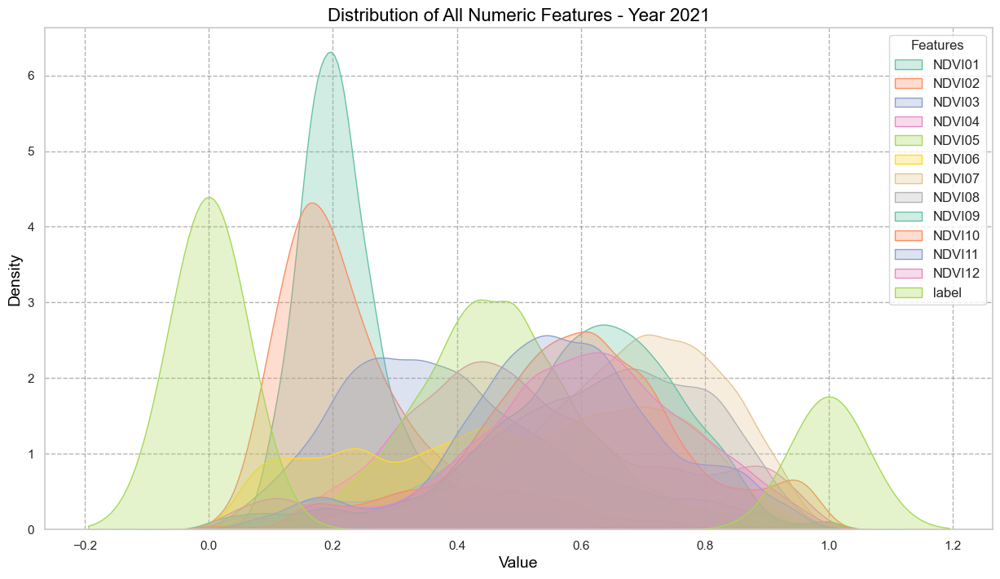

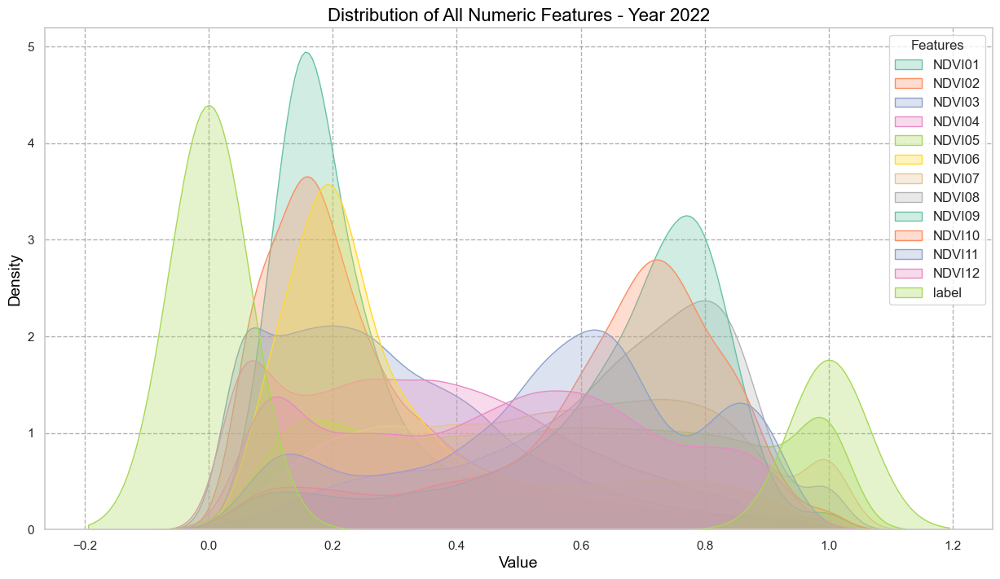

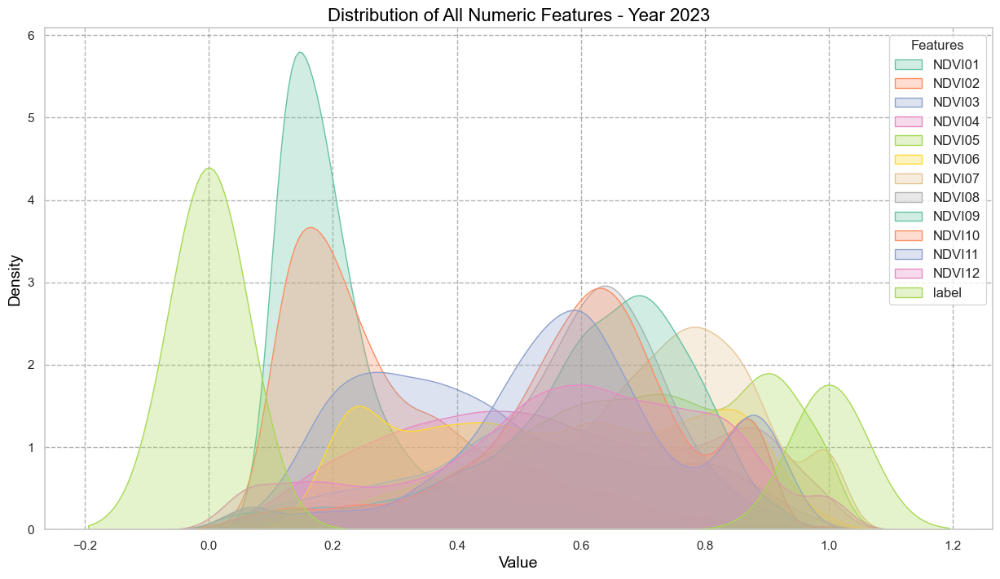

In [2986]:

# Suppress specific FutureWarnings related to seaborn's use of mode.use_inf_as_na
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn._oldcore")

# List of dataset names
datasets = [year_2021, year_2022, year_2023]

# List of dataset names for titles or labeling
dataset_names = ['Year 2021', 'Year 2022', 'Year 2023']

# Iterate through each dataset
for idx, dataset in enumerate(datasets):
    # Extract dataset name for the title
    dataset_name = dataset_names[idx]
    
    # Define the title for the plot
    title = f"Feature Distributions - {dataset_name}"
    
    # Select numeric columns from the dataset
    numeric_features = dataset.select_dtypes(include=['number']).columns

    # Set up the figure for each dataset
    plt.figure(figsize=(15, 8))

    # Define a custom color palette
    custom_palette = sns.color_palette("Set2", n_colors=len(numeric_features))

    # Iterate through numeric features and plot their distributions with custom colors
    for i, feature in enumerate(numeric_features):
        sns.kdeplot(dataset[feature], label=feature, fill=True, alpha=0.3, color=custom_palette[i])

    # Add title and labels
    plt.title(f"Distribution of All Numeric Features - {dataset_name}", fontsize=16, color='black')
    plt.xlabel("Value", fontsize=14, color='black')
    plt.ylabel("Density", fontsize=14, color='black')

    # Display legend for each feature/column
    plt.legend(title="Features", loc='upper right', bbox_to_anchor=(1, 1), fontsize=12, title_fontsize=12)

    # Show the plot with a grid
    plt.grid(True, linestyle='--', alpha=0.6, color='gray')  # Optional: Add a gray grid for better readability

    # Show the plot for the dataset
    plt.show()

## 6.5. Histogram Plotting 

This code generates a grid of histograms and KDE curves for all numeric features in each dataset (2021, 2022, and 2023). The subplots are organized in a 3-column layout, with the main title indicating the dataset year. Each feature is visualized with its histogram overlaid by a KDE curve, allowing an easy comparison of the distribution and density.

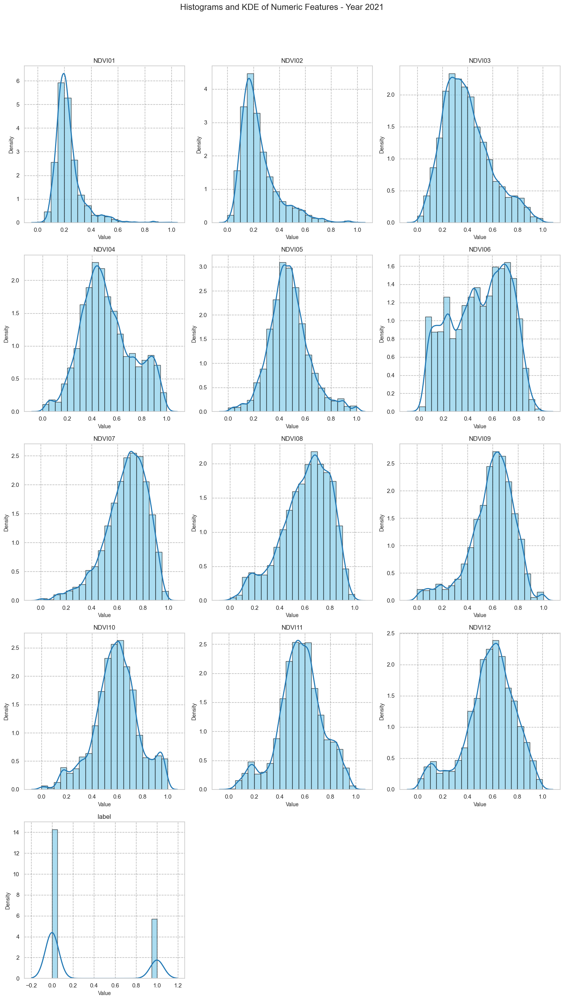

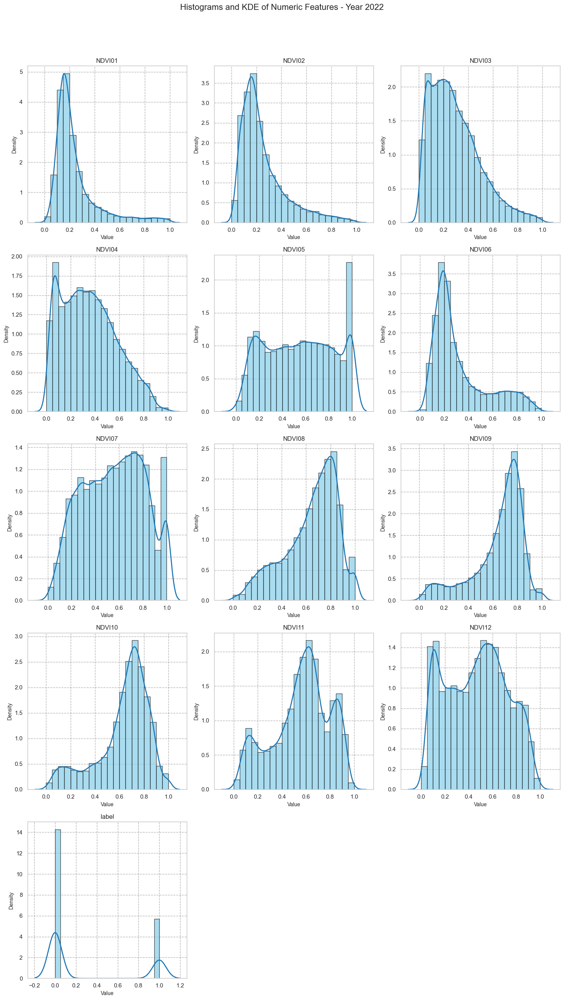

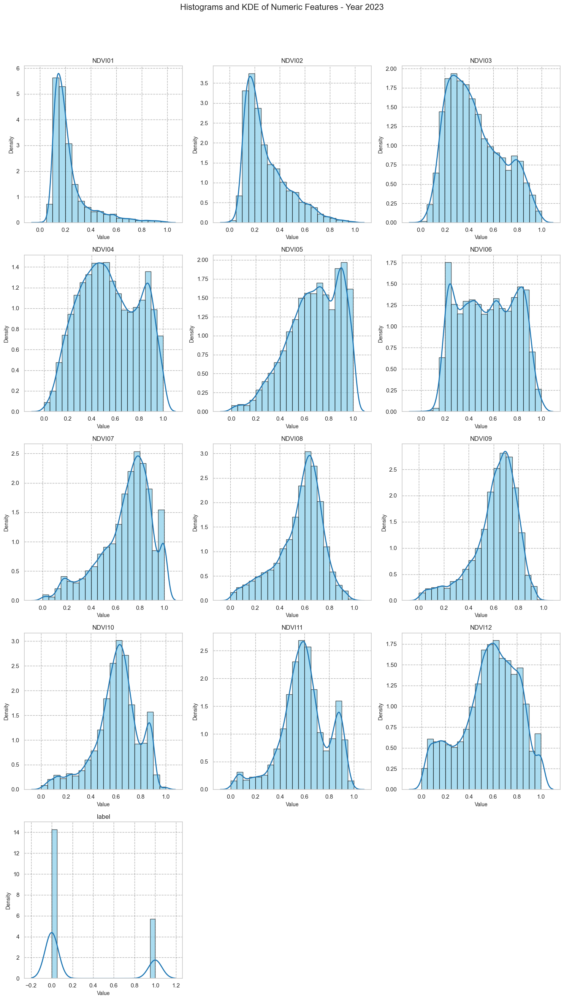

In [2987]:
# Suppress specific FutureWarnings related to seaborn's use of mode.use_inf_as_na
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn._oldcore")

# List of dataset names 
datasets = [year_2021, year_2022, year_2023]

# List of dataset names for titles or labeling
dataset_names = ['Year 2021', 'Year 2022', 'Year 2023']

# Iterate through each dataset
for idx, dataset in enumerate(datasets):
    # Extract dataset name for the title
    dataset_name = dataset_names[idx]
    
    # Select numeric columns from the dataset
    numeric_features = dataset.select_dtypes(include=['number']).columns
    
    # Calculate grid size based on the number of numeric features
    n_features = len(numeric_features)
    n_rows = (n_features // 3) + (n_features % 3 > 0)  # Rows needed for a 3-column layout
    n_cols = 3  # Fixed number of columns
    
    # Set up the figure and axes for a 4x3 grid
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 5*n_rows))
    
    # Flatten axes array for easier indexing if the number of features is less than grid size
    axes = axes.flatten()
    
    # Iterate through numeric features and plot histograms with KDE curve
    for i, feature in enumerate(numeric_features):
        ax = axes[i]
        
        # Plot the histogram for the current feature
        ax.hist(dataset[feature], bins=20, alpha=0.7, color='skyblue', edgecolor='black', density=True)
        
        # Overlay the KDE curve
        sns.kdeplot(dataset[feature], ax=ax, color='#1f77b4', linewidth=2)

        # Add title and labels for each subplot
        ax.set_title(f"{feature}", fontsize=12)
        ax.set_xlabel("Value", fontsize=10)
        ax.set_ylabel("Density", fontsize=10)  # Density instead of frequency for KDE
        ax.grid(True, linestyle='--', alpha=0.6, color='gray')

    # Remove any unused subplots if there are fewer features than grid slots
    for i in range(n_features, len(axes)):
        fig.delaxes(axes[i])

    # Adjust layout for better spacing between subplots
    plt.tight_layout()

    # Add a main title for the entire dataset grid
    fig.suptitle(f"Histograms and KDE of Numeric Features - {dataset_name}", fontsize=16, y=1.05)
    
    # Show the plot for the dataset
    plt.show()


## 6.6. Boxplot Plotting 

This code generates boxplots for the numeric features in each dataset (2021, 2022, and 2023). It organizes the plots in a 3-column grid layout, and each feature is visualized with a boxplot to show its distribution. The main title of the plot indicates the dataset year, and unused subplots are removed for cleaner presentation.

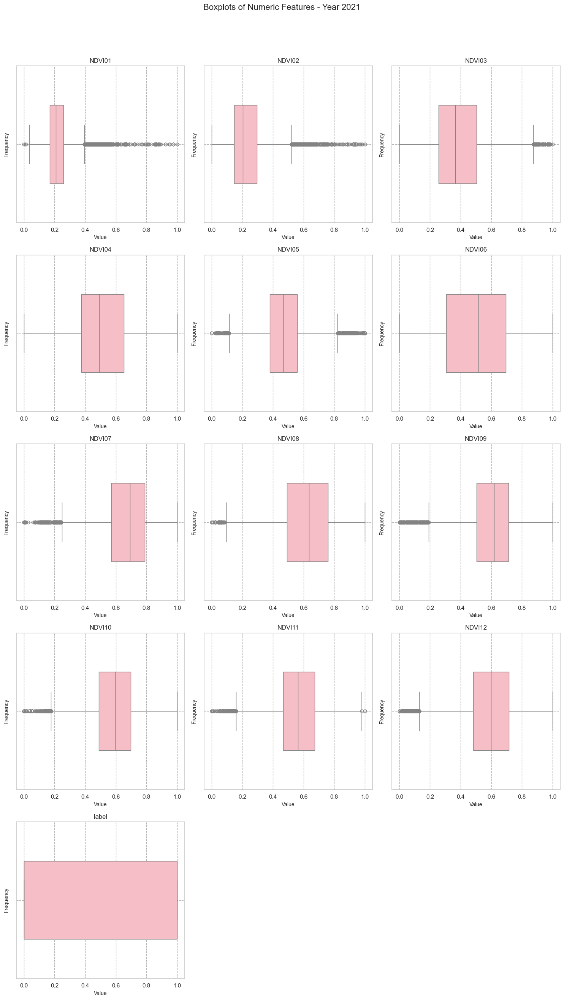

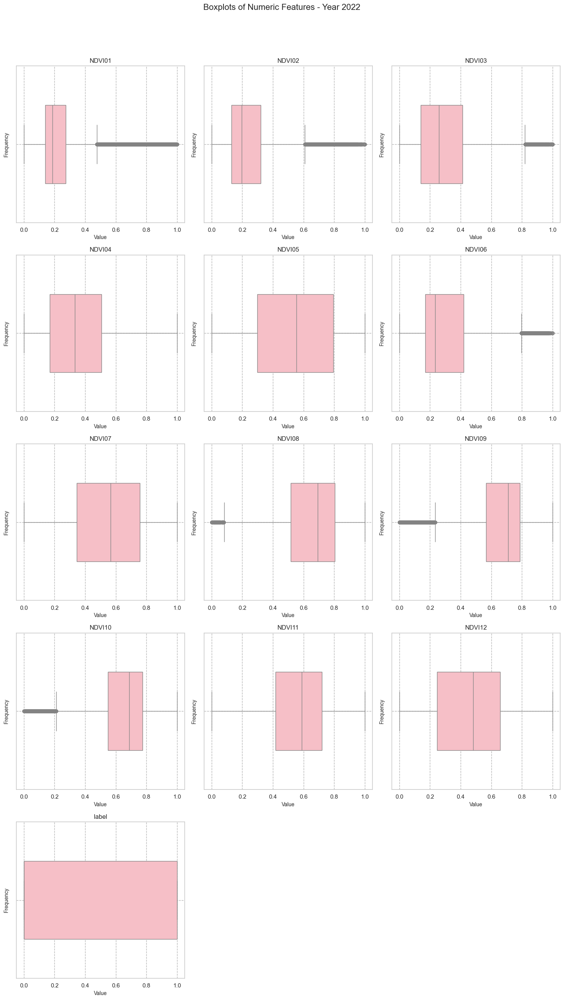

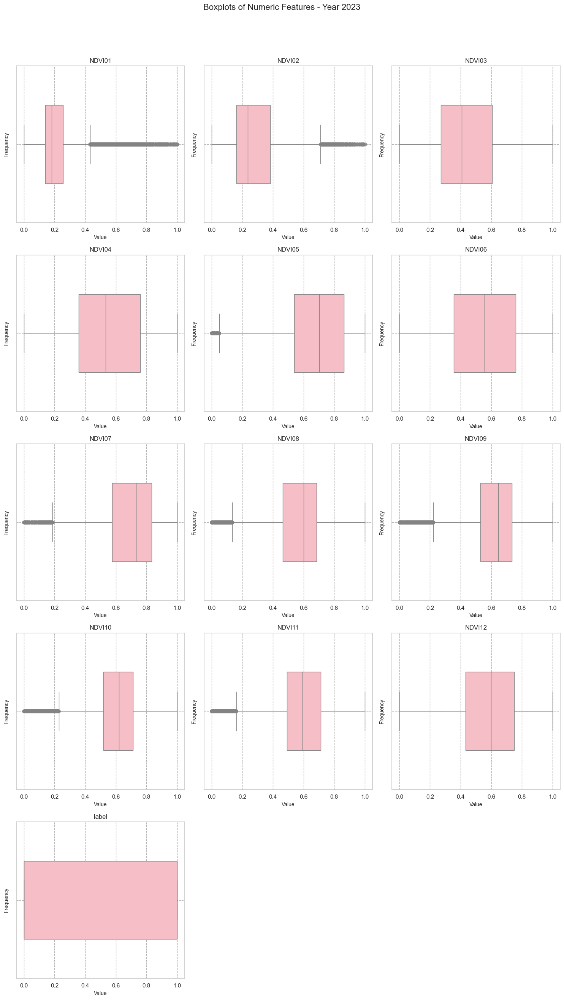

In [2988]:
# Suppress specific FutureWarnings related to seaborn's use of mode.use_inf_as_na
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn._oldcore")

# Iterate through each dataset
for idx, dataset in enumerate(datasets):
    # Extract dataset name for the title
    dataset_name = dataset_names[idx]
    
    # Select numeric columns from the dataset
    numeric_features = dataset.select_dtypes(include=['number']).columns
    
    # Calculate grid size based on the number of numeric features
    n_features = len(numeric_features)
    n_rows = (n_features // 3) + (n_features % 3 > 0)  # Rows needed for a 3-column layout
    n_cols = 3  # Fixed number of columns
    
    # Set up the figure and axes for a 4x3 grid
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 5*n_rows))
    
    # Flatten axes array for easier indexing if the number of features is less than grid size
    axes = axes.flatten()
    
    # Iterate through numeric features and plot box plots
    for i, feature in enumerate(numeric_features):
        ax = axes[i]
        
        # Plot the boxplot for the current feature
        sns.boxplot(x=dataset[feature], ax=ax, color='lightpink', width=0.5)

        # Add title and labels for each subplot
        ax.set_title(f"{feature}", fontsize=12)
        ax.set_xlabel("Value", fontsize=10)
        ax.set_ylabel("Frequency", fontsize=10)
        ax.grid(True, linestyle='--', alpha=0.6, color='gray')

    # Remove any unused subplots if there are fewer features than grid slots
    for i in range(n_features, len(axes)):
        fig.delaxes(axes[i])

    # Adjust layout for better spacing between subplots
    plt.tight_layout()

    # Add a main title for the entire dataset grid
    fig.suptitle(f"Boxplots of Numeric Features - {dataset_name}", fontsize=16, y=1.05)
    
    # Show the plot for the dataset
    plt.show()


## 6.6. Violin Plot Plotting 

This code generates violin plots for the numeric features in each dataset (2021, 2022, and 2023). It arranges the plots in a 3-column grid and uses violin plots to display the distribution of each feature. The plots are labeled and have a main title for the dataset year, with unused subplots removed for cleaner presentation.

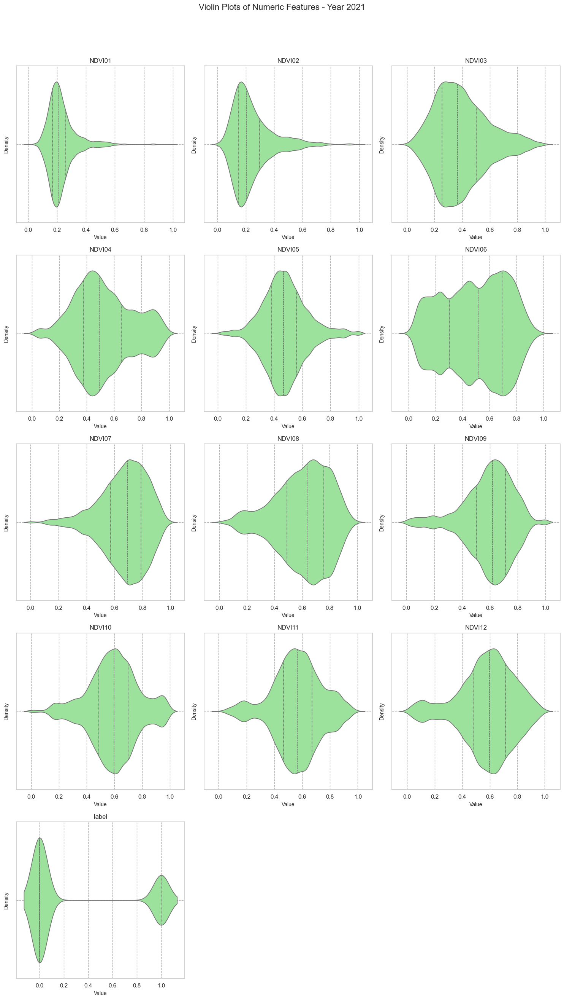

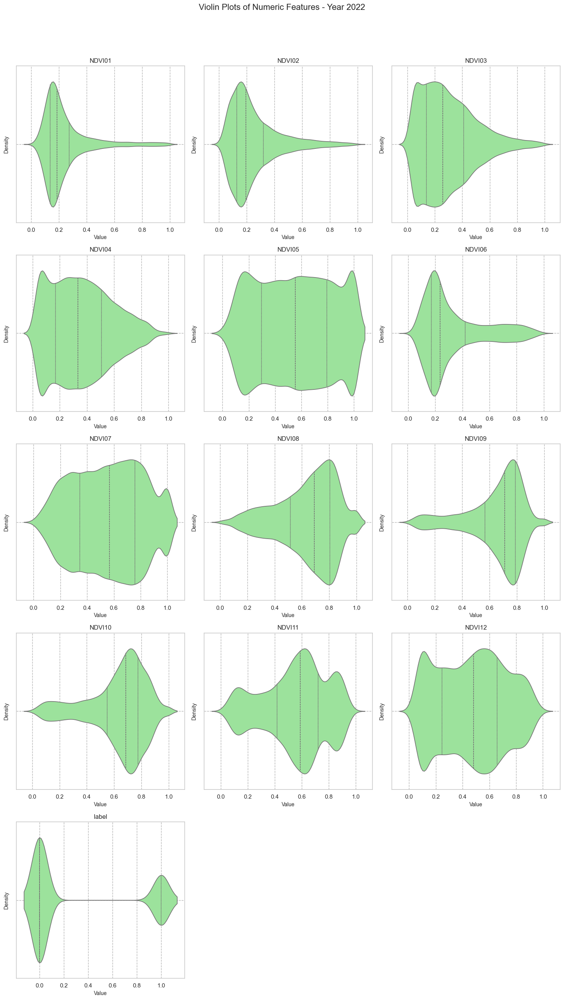

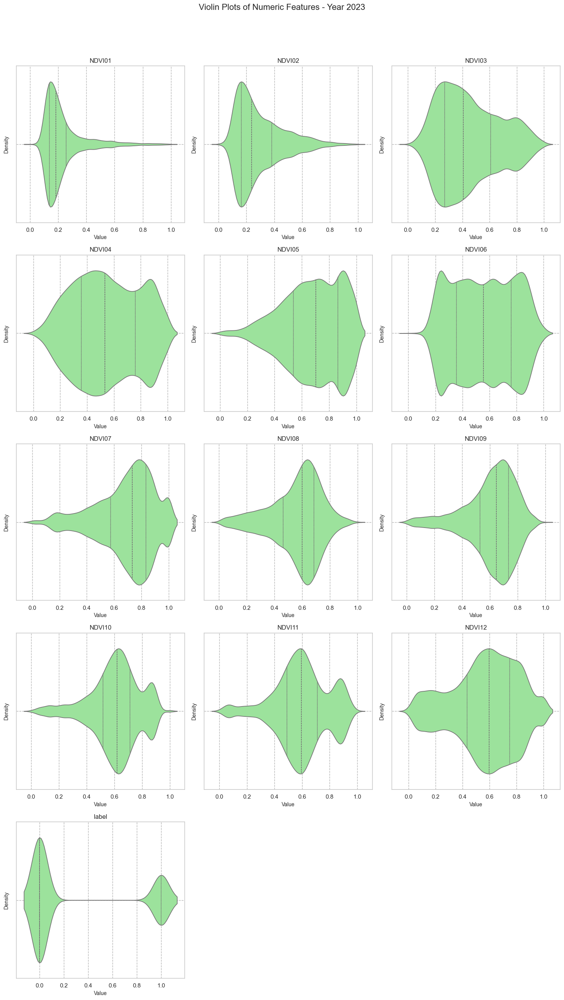

In [2989]:
# Suppress specific FutureWarnings related to seaborn's use of mode.use_inf_as_na
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn._oldcore")


# Iterate through each dataset
for idx, dataset in enumerate(datasets):
    # Extract dataset name for the title
    dataset_name = dataset_names[idx]
    
    # Select numeric columns from the dataset
    numeric_features = dataset.select_dtypes(include=['number']).columns
    
    # Calculate grid size based on the number of numeric features
    n_features = len(numeric_features)
    n_rows = (n_features // 3) + (n_features % 3 > 0)  # Rows needed for a 3-column layout
    n_cols = 3  # Fixed number of columns
    
    # Set up the figure and axes for a 4x3 grid
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 5*n_rows))
    
    # Flatten axes array for easier indexing if the number of features is less than grid size
    axes = axes.flatten()
    
    # Iterate through numeric features and plot violin plots
    for i, feature in enumerate(numeric_features):
        ax = axes[i]
        
        # Plot the violin plot for the current feature
        sns.violinplot(x=dataset[feature], ax=ax, color='lightgreen', inner='quart', linewidth=1.25)

        # Add title and labels for each subplot
        ax.set_title(f"{feature}", fontsize=12)
        ax.set_xlabel("Value", fontsize=10)
        ax.set_ylabel("Density", fontsize=10)  # Density instead of frequency
        ax.grid(True, linestyle='--', alpha=0.6, color='gray')

    # Remove any unused subplots if there are fewer features than grid slots
    for i in range(n_features, len(axes)):
        fig.delaxes(axes[i])

    # Adjust layout for better spacing between subplots
    plt.tight_layout()

    # Add a main title for the entire dataset grid
    fig.suptitle(f"Violin Plots of Numeric Features - {dataset_name}", fontsize=16, y=1.05)
    
    # Show the plot for the dataset
    plt.show()


# 7. Feature Engineering

## 7.1. Plot Confusion Matrix Before Feature Engineering

This code defines a function to plot the correlation matrix for each dataset (year_2021, year_2022, and year_2023). It computes the correlation matrix using the corr() method, then visualizes it using a heatmap with annotations and a blue color palette. The correlation matrix is displayed for each dataset in the list.

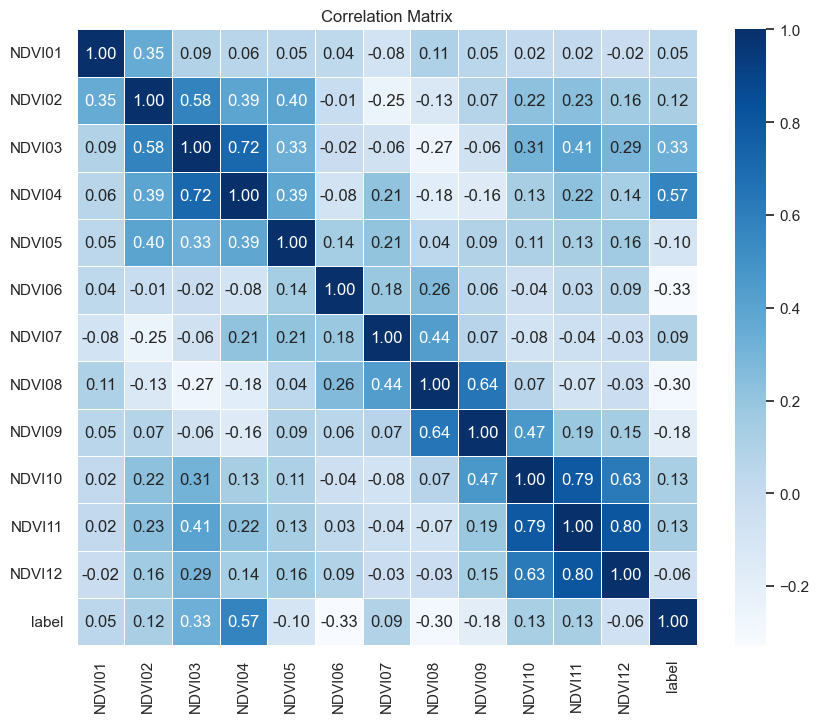

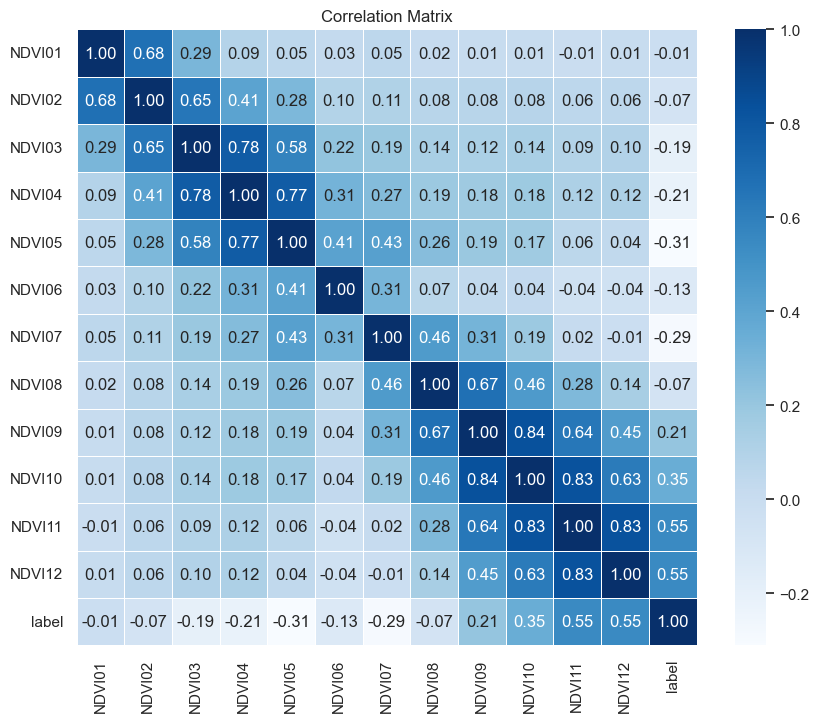

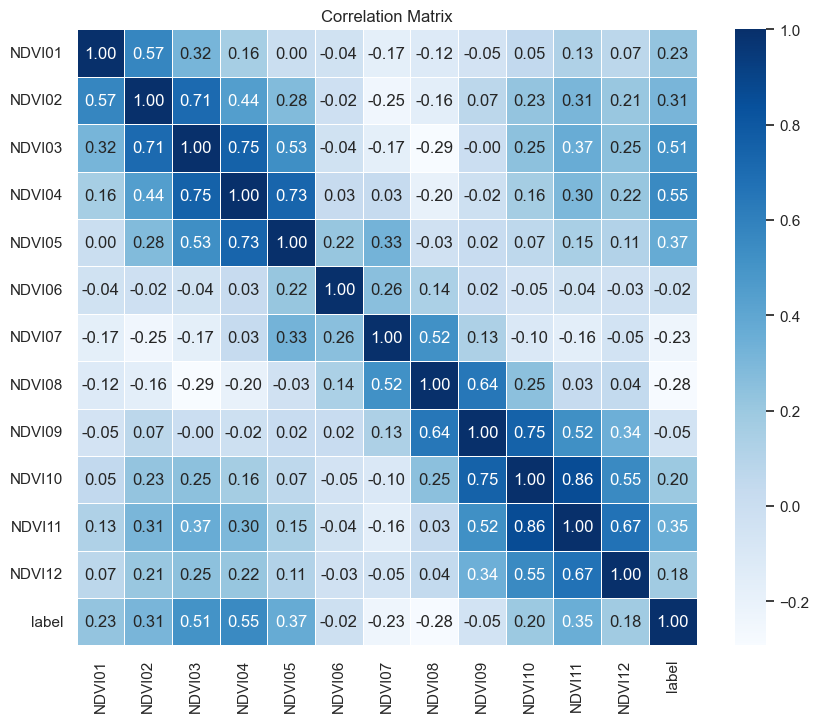

In [2990]:
datasets = [year_2021, year_2022, year_2023]

# Function to plot correlation matrix
def plot_correlation_matrix(df, title="Correlation Matrix"):
    # Calculate the correlation matrix
    correlation_matrix = df.corr()

    # Create a heatmap to visualize the correlation matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt='.2f', linewidths=0.5)
    plt.title(title)
    plt.show()

# Plot correlation matrices for each dataset
for dataset in datasets:
    plot_correlation_matrix(dataset)


## 7.2. Display VIF Values Before Feature Engineering

This code calculates the Variance Inflation Factor (VIF) for each dataset's numeric features to check for multicollinearity. It defines functions to compute and print VIF values for each dataset in the list (year_2021, year_2022, year_2023). The output displays the VIF values for each feature in each dataset.

In [2991]:
# Function to calculate VIF values
def calculate_vif(df):
    # Add constant to the DataFrame (intercept for regression)
    X = add_constant(df)
    
    # Calculate VIF for each feature
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    
    return vif_data

# Assuming your datasets are stored in variables like cotton2021, cotton2022, etc.

datasets = [year_2021, year_2022, year_2023]

# Function to print VIF values for each dataset
def print_vif(datasets):
    for df in datasets:
        print(f"VIF values for dataset:")
        # Select only numeric columns for VIF calculation
        numeric_df = df.select_dtypes(include=[np.number])
        vif_values = calculate_vif(numeric_df)
        print(vif_values)
        print("\n" + "="*50 + "\n")

# Print VIF values for each dataset
print_vif(datasets)


VIF values for dataset:
   Feature        VIF
0    const  45.610665
1   NDVI01   1.231849
2   NDVI02   2.192660
3   NDVI03   3.278131
4   NDVI04   3.940012
5   NDVI05   1.754315
6   NDVI06   1.250685
7   NDVI07   1.964194
8   NDVI08   3.259984
9   NDVI09   3.061242
10  NDVI10   4.138253
11  NDVI11   5.366743
12  NDVI12   3.126004
13   label   2.423324


VIF values for dataset:
   Feature        VIF
0    const  17.265377
1   NDVI01   2.021035
2   NDVI02   3.125006
3   NDVI03   3.850759
4   NDVI04   4.427791
5   NDVI05   3.148486
6   NDVI06   1.269406
7   NDVI07   1.626930
8   NDVI08   2.259030
9   NDVI09   5.154865
10  NDVI10   6.781612
11  NDVI11   7.246906
12  NDVI12   3.562175
13   label   1.955779


VIF values for dataset:
   Feature        VIF
0    const  36.363398
1   NDVI01   1.641549
2   NDVI02   3.087654
3   NDVI03   4.270902
4   NDVI04   4.006648
5   NDVI05   2.999246
6   NDVI06   1.127090
7   NDVI07   2.195964
8   NDVI08   3.277898
9   NDVI09   4.994848
10  NDVI10   7.926713


## 7.3. Plot VIF Values Before Feature Engineering

This code calculates and visualizes the Variance Inflation Factor (VIF) for each dataset's numeric features. The plot_vif function generates bar plots to display the VIF values, helping identify features with high multicollinearity for each dataset (year 2021, 2022, 2023).

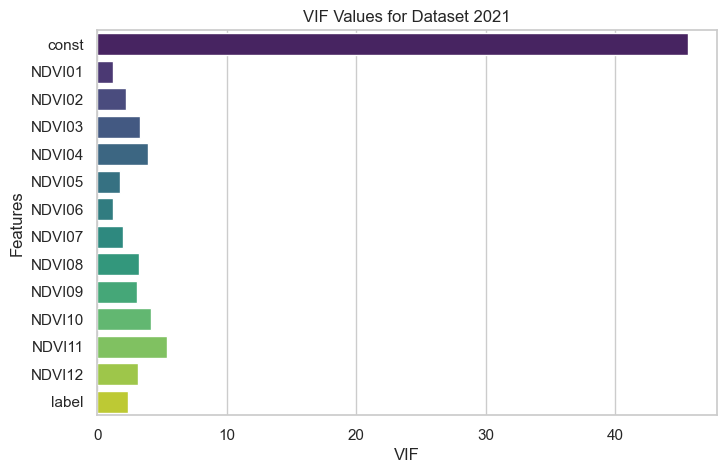

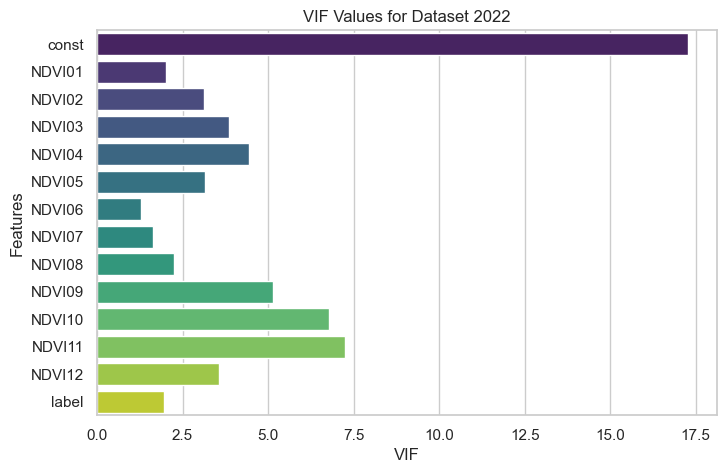

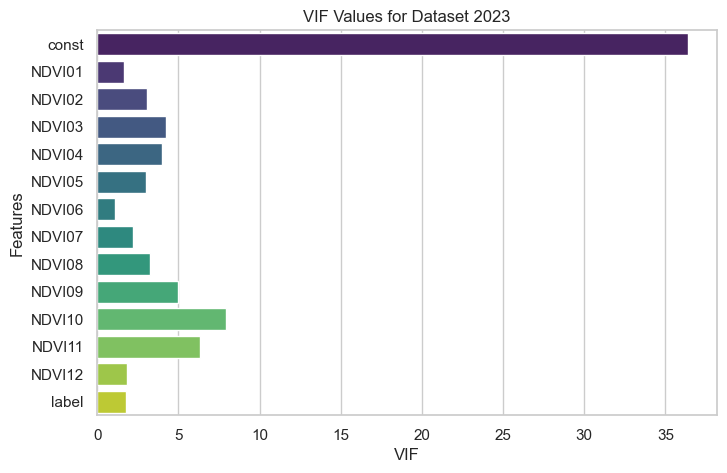

In [2992]:
# Function to calculate VIF values
def calculate_vif(df):
    # Add constant to the DataFrame (intercept for regression)
    X = add_constant(df)
    
    # Calculate VIF for each feature
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    
    return vif_data

# Assuming your datasets are stored in variables like cotton2021, cotton2022, etc.

datasets = [year_2021, year_2022, year_2023]

# Function to plot VIF values for each dataset
def plot_vif(datasets):
    for idx, df in enumerate(datasets):
        # Select only numeric columns for VIF calculation
        numeric_df = df.select_dtypes(include=[np.number])
        vif_values = calculate_vif(numeric_df)
        
        # Plot the VIF values
        plt.figure(figsize=(8, 5))
        sns.barplot(x='VIF', y='Feature', data=vif_values, palette='viridis')
        plt.title(f'VIF Values for Dataset {idx + 2021}')
        plt.xlabel('VIF')
        plt.ylabel('Features')
        plt.show()

# Plot VIF values for each dataset
plot_vif(datasets)


## 7.4. Drop Features

This code drops the column 'NDVI03' from all datasets (year_2021, year_2022, year_2023) and their respective copies (year_2021_copy, year_2022_copy, year_2023_copy). The column removal ensures that the 'NDVI03' feature is excluded from further analysis or modeling.

In [2993]:
# Drop  'NDVI03' column from all datasets
year_2021 = year_2021.drop(columns=['NDVI03','NDVI10','NDVI12'])
year_2022 = year_2022.drop(columns=['NDVI03','NDVI10','NDVI12'])
year_2023 = year_2023.drop(columns=[ 'NDVI03','NDVI10','NDVI12'])
year_2021_copy = year_2021_copy.drop(columns=[ 'NDVI03','NDVI10','NDVI12'])
year_2022_copy = year_2022_copy.drop(columns=[ 'NDVI03','NDVI10','NDVI12'])
year_2023_copy = year_2023_copy.drop(columns=[ 'NDVI03','NDVI10','NDVI12'])



## 7.5. Plot Confusion Matrix After Feature Engineering

After dropping the 'NDVI03' feature from all datasets, the correlation matrices for each dataset are plotted. This visualization allows you to observe the relationships between the remaining numeric features and identify any significant correlations after feature removal.

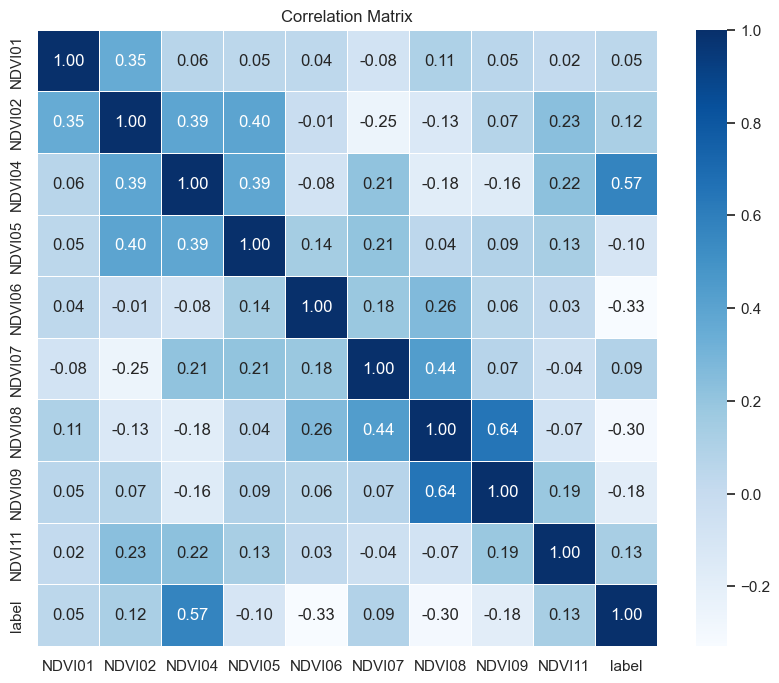

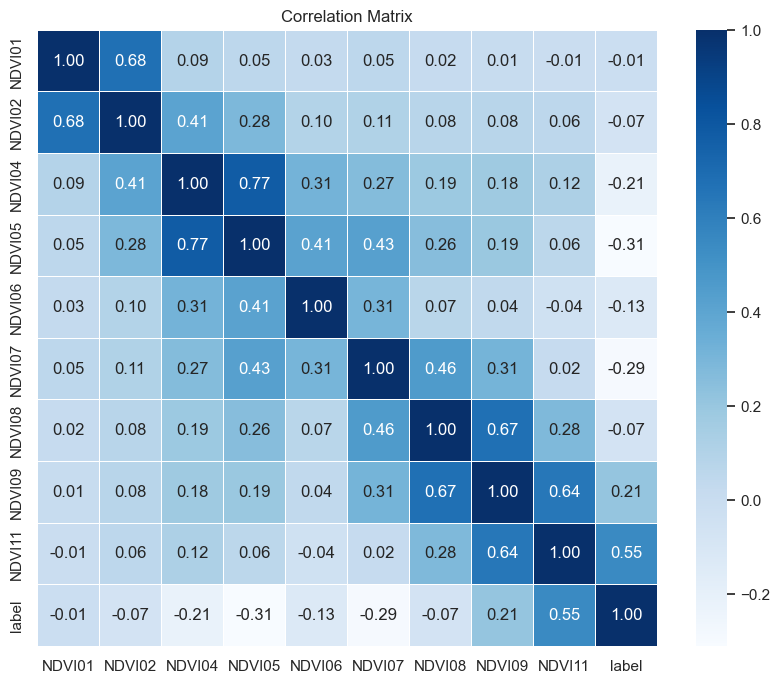

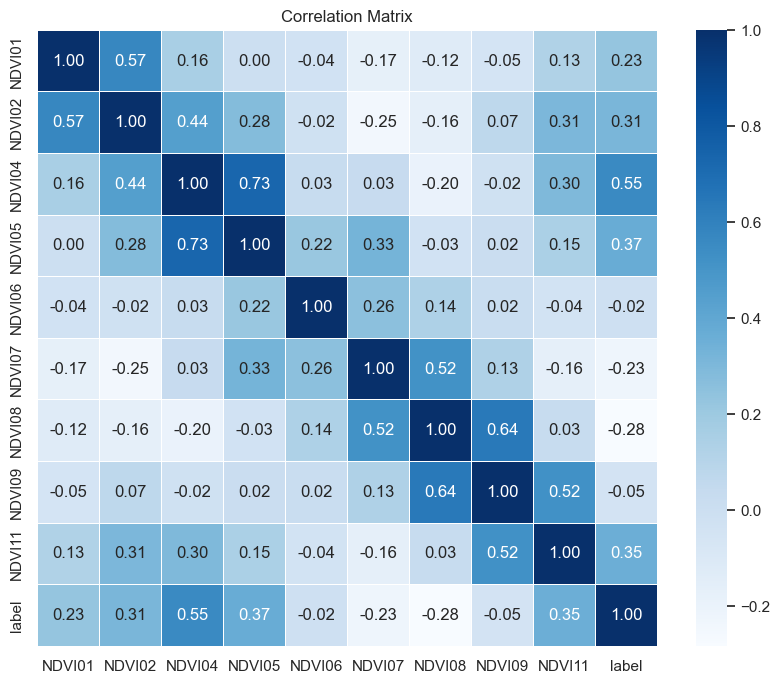

In [2994]:
datasets = [year_2021, year_2022, year_2023]

# Function to plot correlation matrix
def plot_correlation_matrix(df, title="Correlation Matrix"):
    # Calculate the correlation matrix
    correlation_matrix = df.corr()

    # Create a heatmap to visualize the correlation matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt='.2f', linewidths=0.5)
    plt.title(title)
    plt.show()

# Plot correlation matrices for each dataset
for dataset in datasets:
    plot_correlation_matrix(dataset)

## 7.6. Display VIF Values After Feature Engineering

After feature engineering, the code calculates and prints the Variance Inflation Factor (VIF) values for each dataset. It checks for multicollinearity by computing the VIF for each numeric feature in the datasets (year_2021, year_2022, year_2023). High VIF values indicate potential multicollinearity, which can impact the performance of machine learning models.

In [2995]:
# Function to calculate VIF values
def calculate_vif(df):
    # Add constant to the DataFrame (intercept for regression)
    X = add_constant(df)
    
    # Calculate VIF for each feature
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    
    return vif_data

# Assuming your datasets are stored in variables like cotton2021, cotton2022, etc.

datasets = [year_2021, year_2022, year_2023]

# Function to print VIF values for each dataset
def print_vif(datasets):
    for df in datasets:
        print(f"VIF values for dataset:")
        # Select only numeric columns for VIF calculation
        numeric_df = df.select_dtypes(include=[np.number])
        vif_values = calculate_vif(numeric_df)
        print(vif_values)
        print("\n" + "="*50 + "\n")

# Print VIF values for each dataset
print_vif(datasets)

VIF values for dataset:
   Feature        VIF
0    const  45.118845
1   NDVI01   1.226295
2   NDVI02   1.890683
3   NDVI04   2.459930
4   NDVI05   1.727414
5   NDVI06   1.241252
6   NDVI07   1.959299
7   NDVI08   3.093005
8   NDVI09   2.288448
9   NDVI11   1.206584
10   label   2.182608


VIF values for dataset:
   Feature        VIF
0    const  17.117555
1   NDVI01   2.008171
2   NDVI02   2.391543
3   NDVI04   2.961307
4   NDVI05   3.135159
5   NDVI06   1.265804
6   NDVI07   1.613248
7   NDVI08   2.212685
8   NDVI09   3.119786
9   NDVI11   2.605684
10   label   1.859910


VIF values for dataset:
   Feature        VIF
0    const  35.302790
1   NDVI01   1.623646
2   NDVI02   2.093494
3   NDVI04   3.151308
4   NDVI05   2.988055
5   NDVI06   1.120822
6   NDVI07   2.179950
7   NDVI08   3.175913
8   NDVI09   3.260612
9   NDVI11   2.083577
10   label   1.747170




## 7.7. Plot VIF Values After Feature Engineering

After feature engineering, the code calculates the Variance Inflation Factor (VIF) values for each dataset (year_2021, year_2022, year_2023) to assess multicollinearity. It then visualizes the VIF values using bar plots to help identify highly correlated features that may require further adjustments, such as removing or transforming them, to improve model performance.

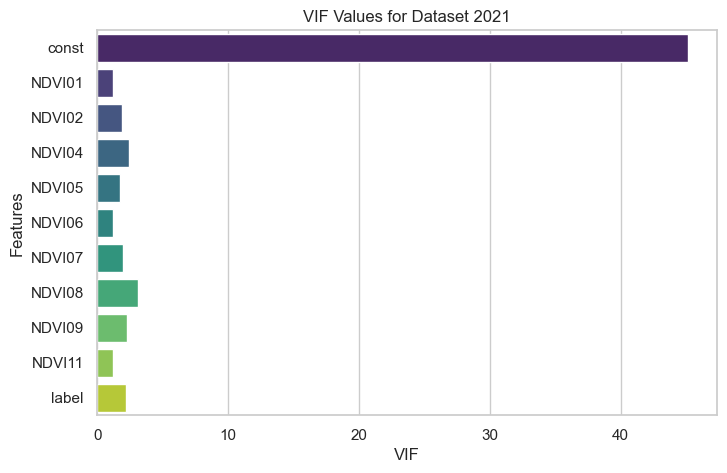

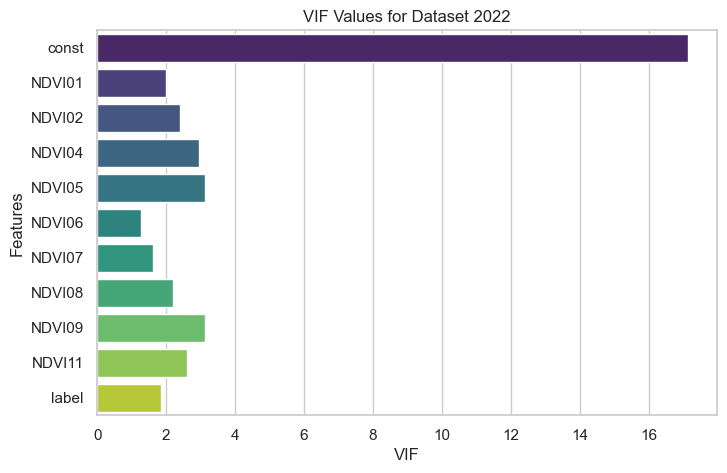

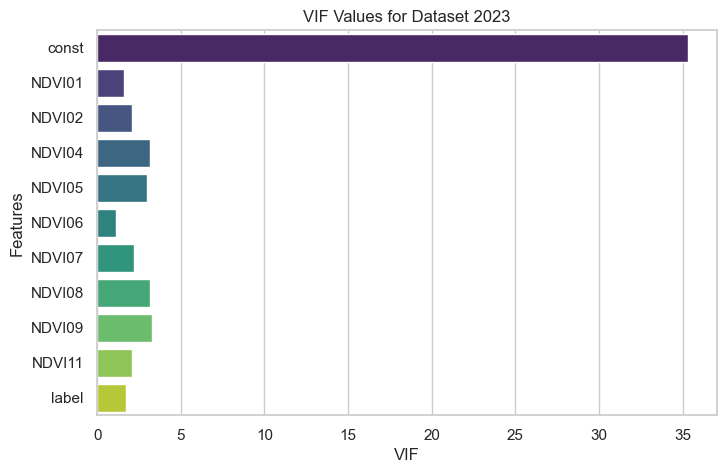

In [2996]:
# Function to calculate VIF values
def calculate_vif(df):
    # Add constant to the DataFrame (intercept for regression)
    X = add_constant(df)
    
    # Calculate VIF for each feature
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    
    return vif_data

# Assuming your datasets are stored in variables like cotton2021, cotton2022, etc.

datasets = [year_2021, year_2022, year_2023]

# Function to plot VIF values for each dataset
def plot_vif(datasets):
    for idx, df in enumerate(datasets):
        # Select only numeric columns for VIF calculation
        numeric_df = df.select_dtypes(include=[np.number])
        vif_values = calculate_vif(numeric_df)
        
        # Plot the VIF values
        plt.figure(figsize=(8, 5))
        sns.barplot(x='VIF', y='Feature', data=vif_values, palette='viridis')
        plt.title(f'VIF Values for Dataset {idx + 2021}')
        plt.xlabel('VIF')
        plt.ylabel('Features')
        plt.show()

# Plot VIF values for each dataset
plot_vif(datasets)


# 8. Fixing Class Imbalance

## 8.1. Display Class Frequency Before Fixing Imbalance

This code visualizes the distribution of the target variable 'CropType' (represented by the 'label' feature) for each year (2021, 2022, and 2023) using count plots. It displays the class distribution for each year, helping to assess the balance between cotton (label 0) and rice (label 1) in the datasets.

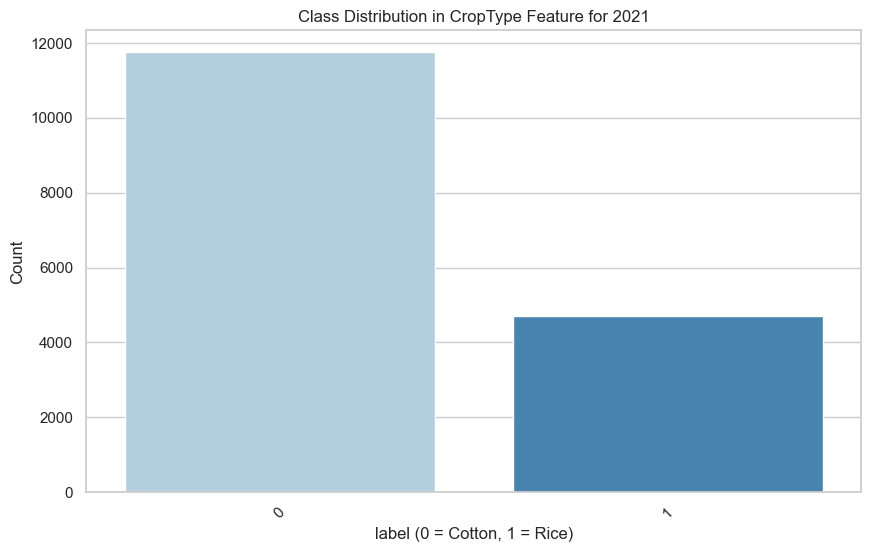

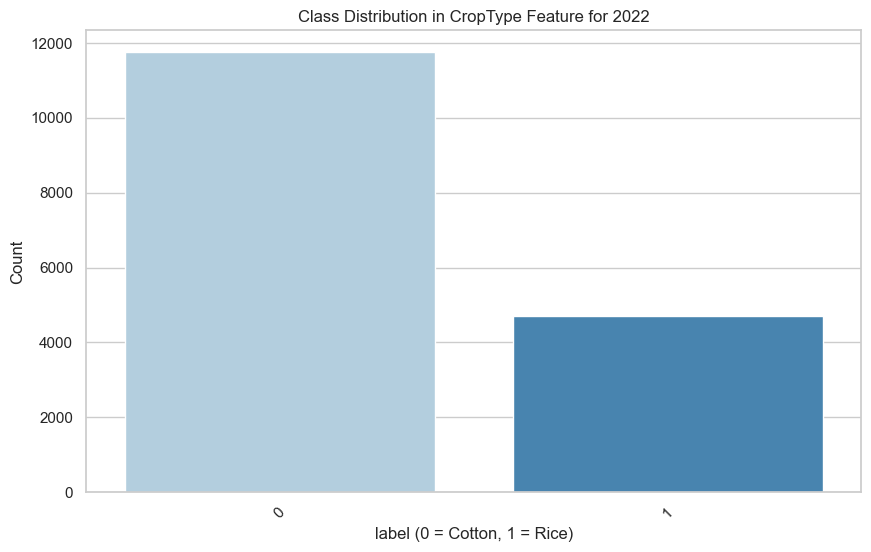

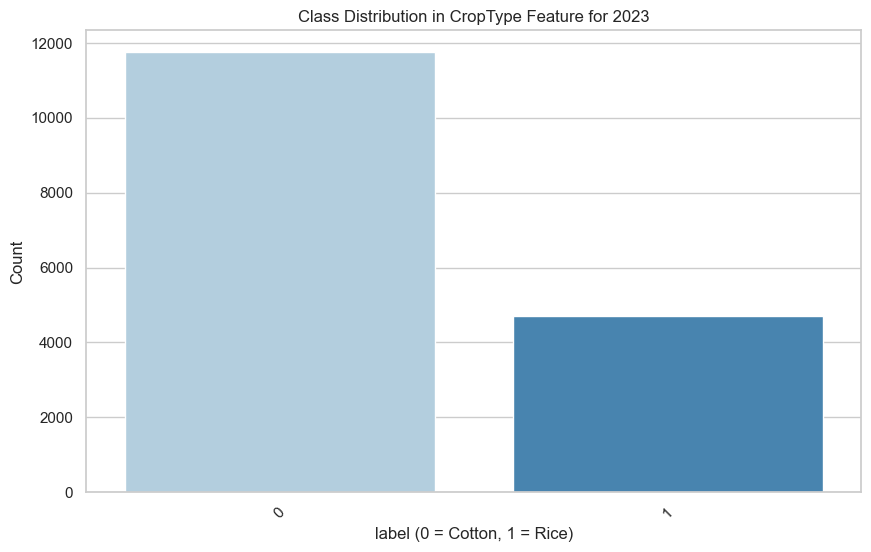

In [2997]:
# Step 1: Set the style for the plot
sns.set(style="whitegrid")

# Plot the distribution of the target variable 'CropType' for each year
for year, data in zip([2021, 2022, 2023], [year_2021, year_2022, year_2023]):
    plt.figure(figsize=(10, 6))
    sns.countplot(data=data, x='label', palette='Blues')
    plt.title(f'Class Distribution in CropType Feature for {year}')
    plt.xlabel('label (0 = Cotton, 1 = Rice)')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

## 8.2. Apply Smote

This function applies scaling and Synthetic Minority Over-sampling Technique (SMOTE) to balance the classes in the dataset, aiming for a 70% minority class balance. It separates the features from the target variable, resamples the data, and returns a new DataFrame with balanced classes for further analysis or model training.

In [2998]:
# Function to apply scaling and SMOTE with 70% minority class balancing
def apply_scaling_and_smote(data):
    X = data.drop('label', axis=1)  # Features
    y = data['label']  # Target variable

    # Set the sampling strategy to 70% of the majority class
    majority_class_size = sum(y == y.mode()[0])  # Size of the majority class
    smote = SMOTE(sampling_strategy=0.7, random_state=42)  # 70% of the majority class size
    X_resampled, y_resampled = smote.fit_resample(X, y)

    # Create a new DataFrame with the resampled data
    resampled_data = pd.DataFrame(X_resampled, columns=X.columns)
    resampled_data['label'] = y_resampled  # Adding the target column back

    return resampled_data


The scaling and SMOTE techniques are applied to each year's dataset (2021, 2022, and 2023) to balance the class distribution. The resampled datasets are then updated with the balanced classes, ready for further analysis or modeling.

In [2999]:
# Apply scaling and SMOTE to each year's dataset
year_2021 = apply_scaling_and_smote(year_2021)
year_2022 = apply_scaling_and_smote(year_2022)
year_2023 = apply_scaling_and_smote(year_2023)

## 8.3. Apply Scaling On Yearly Datasets 

In [3000]:
# Function to apply Min-Max Scaling and retain the label column
def apply_minmax_scaling(data):
    # Separate features (X) and target (y)
    X = data.drop('label', axis=1)  # Features
    y = data['label']  # Target variable

    # Apply Min-Max Scaling to features
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)

    # Create a new DataFrame with scaled features
    scaled_data = pd.DataFrame(X_scaled, columns=X.columns)
    scaled_data['label'] = y  # Add the label column back

    return scaled_data

# # # Apply the function to each dataset
year_2021 = apply_minmax_scaling(year_2021)
year_2022 = apply_minmax_scaling(year_2022)
year_2023 = apply_minmax_scaling(year_2023)

# # Apply the function to each dataset
year_2021_copy = apply_minmax_scaling(year_2021_copy)
year_2022_copy = apply_minmax_scaling(year_2022_copy)
year_2023_copy = apply_minmax_scaling(year_2023_copy)

## 8.4. Display Class Frequency After Fixing Imbalance

After applying SMOTE, the class distribution of the target variable 'CropType' for each year (2021, 2022, and 2023) is plotted. The updated distribution shows a more balanced count between the cotton and rice classes.

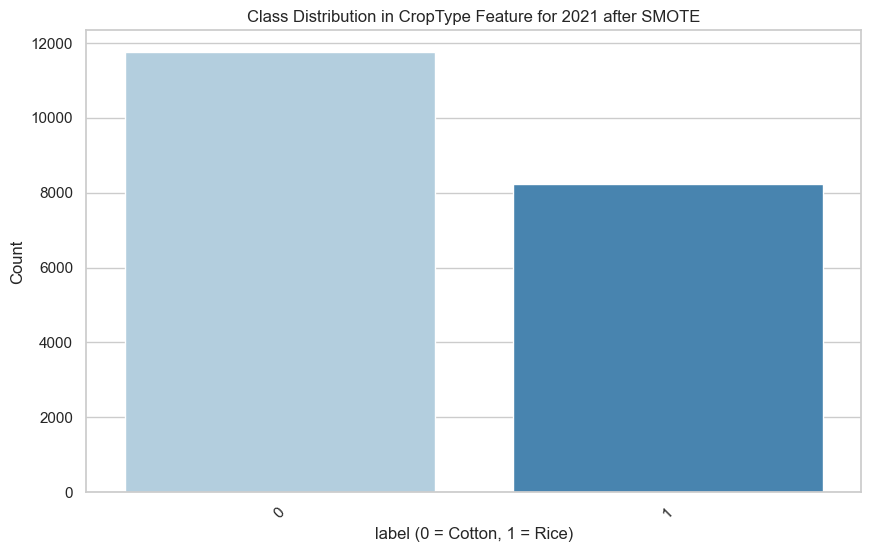

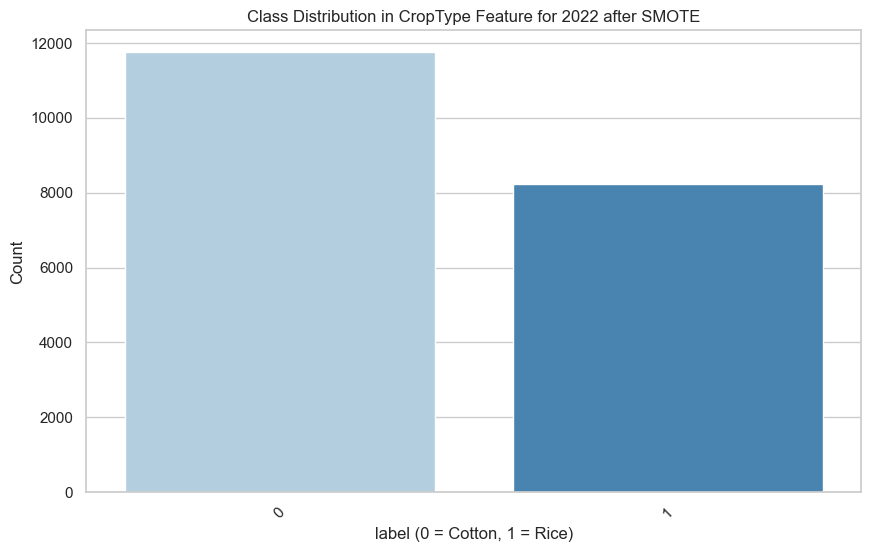

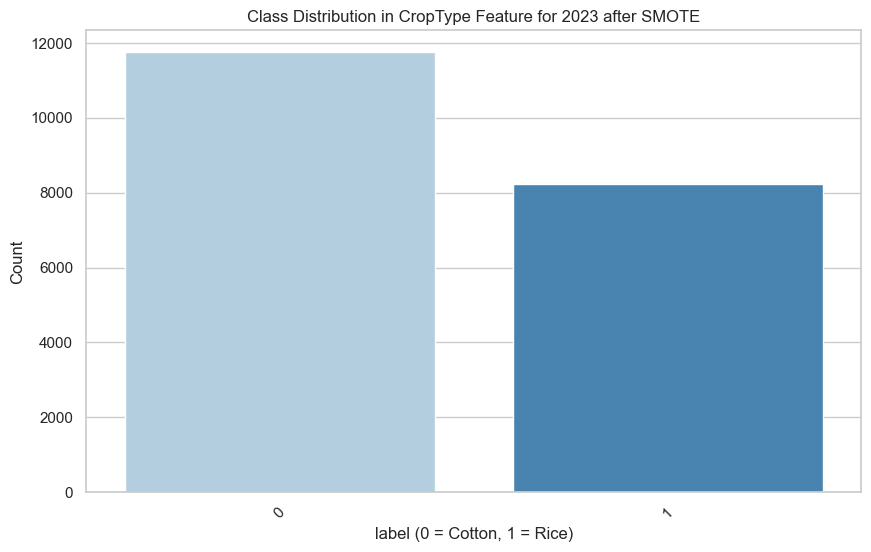

In [3001]:
# Plot the distribution of the target variable 'CropType' for each year after SMOTE
for year, data in zip([2021, 2022, 2023], [year_2021, year_2022, year_2023]):
    plt.figure(figsize=(10, 6))
    sns.countplot(data=data, x='label', palette='Blues')
    plt.title(f'Class Distribution in CropType Feature for {year} after SMOTE')
    plt.xlabel('label (0 = Cotton, 1 = Rice)')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

# 9. Download Datasets For Supervised Learning

The datasets for each year are organized into preprocessed and original categories. The script creates the necessary subdirectories and saves the datasets as CSV files within the appropriate folders. Each dataset is saved successfully with the corresponding file name.

In [3002]:
# List of datasets
datasets = {
    "year_preprocessed": {
        "year2021preprocessed": year_2021,
        "year2022preprocessed": year_2022,
        "year2023preprocessed": year_2023,
    },
    "year_original": {
        "year2021original": year_2021_copy,
        "year2022original": year_2022_copy,
        "year2023original": year_2023_copy,
    }
    
}

# Main directory
main_directory = "Preprocessed-Supervised"

# Create main directory if it doesn't exist
if not os.path.exists(main_directory):
    os.makedirs(main_directory)

# Save files in organized subdirectories
for category, files in datasets.items():
    category_dir = os.path.join(main_directory, category)  # e.g., Preprocessed-Supervised/cotton
    if not os.path.exists(category_dir):
        os.makedirs(category_dir)  # Create subdirectories 'cotton' and 'rice'

    for name, df in files.items():
        file_path = os.path.join(category_dir, f"{name}.csv")  # File path for each CSV
        df.to_csv(file_path, index=False)  # Save DataFrame as CSV
        print(f"Saved {name}.csv in {category_dir}")

Saved year2021preprocessed.csv in Preprocessed-Supervised\year_preprocessed
Saved year2022preprocessed.csv in Preprocessed-Supervised\year_preprocessed
Saved year2023preprocessed.csv in Preprocessed-Supervised\year_preprocessed
Saved year2021original.csv in Preprocessed-Supervised\year_original
Saved year2022original.csv in Preprocessed-Supervised\year_original
Saved year2023original.csv in Preprocessed-Supervised\year_original
